In [1]:
using ITensors
using PyPlot
using LinearAlgebra
using Plots
using Statistics

In [2]:
function entropy_von_neumann(psi::MPS, b::Int)
  s = siteinds(psi)  
  orthogonalize!(psi, b)
  _,S = svd(psi[b], (linkind(psi, b-1), s[b]))
  SvN = 0.0
  for n in 1:dim(S, 1)
    p = S[n,n]^2
    SvN -= p * log(p)
  end
  return SvN
end

function dmrg_critical_TF(a, N)
    sites = siteinds("S=1/2", N)
    os = OpSum()
    for j = 1:N
        jp1 = j % N + 1  # j+1 with periodic boundary
        jm1 = j == 1 ? N : j - 1  # j-1 with periodic boundary
        
        os += -a*(1-a)*4, "Sx", j, "Sx", jp1
        os += a*(1-a)*2, "Sz", jm1
        os += -a^2*8, "Sz", jm1, "Sx", j, "Sx", jp1
    end

    
    H = MPO(os, sites)
    psi0 = randomMPS(sites)

    # Parameters that determine the numerical accuracy
    nsweeps = 100
    maxdim = [10, 20, 100, 100, 200, 300]
    cutoff = [1E-10]

    # Setting outputlevel to 0 to suppress detailed output
    energy, psi = dmrg(H, psi0; nsweeps, maxdim, cutoff,outputlevel=0)

    S = entropy_von_neumann(psi, Int(N/2))
    return energy, S
end

function remove_outliers(x, y, threshold_std = 2.0)
    # 平均と標準偏差を計算
    mean_y = mean(y)
    std_y = std(y)

    # 外れ値を除外
    mask = abs.(y .- mean_y) .<= threshold_std * std_y
    return x[mask], y[mask]
end

remove_outliers (generic function with 2 methods)

In [6]:
L_list =[8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40,42,44,46,48,50,100] 
E_list = zeros(size(L_list))
S_list = zeros(size(L_list))

# aの値を0.46から0.475まで0.0005間隔で変化させる
a_values = 0.46:0.0005:0.475
c_values = []

println("Starting loop")
for a in a_values
    entropy_values = []  # エントロピーの値を保存するためのリスト

    for i = 1:length(L_list)
        println("Calculating for a = $a, L = $(L_list[i])")
        E, S = dmrg_critical_TF(a, L_list[i])
        E_list[i] = E
        S_list[i] = S
        push!(entropy_values, (L_list[i], S))  # エントロピーの値を保存
    end

    # エントロピーの値をファイルに保存
    open("entropy_values_a_$a.txt", "w") do file
        for val in entropy_values
            println(file, val)
        end
    end

    log_L_list = log.(L_list)
    data = hcat(ones(length(log_L_list)), log_L_list)
    coeffs = data \ S_list
    c_fit = coeffs[2] * 3
    push!(c_values, (a, c_fit))

    plot_title = "L vs S (Log Scale) at a=$a, fitted c=$c_fit"
    plot_fig = Plots.plot(L_list, S_list, seriestype=:scatter, label="Data at a=$a", xscale=:log10, legend=:topleft)
    Plots.plot!(plot_fig, L_list, data * coeffs, label="Fit at a=$a")
    xlabel!(plot_fig, "L")
    ylabel!(plot_fig, "S(L)")
    title!(plot_fig, plot_title)
    display(plot_fig)

    # グラフをPDF形式で保存
    savefig(plot_fig, "plot_a_$a.pdf")
end

# a と c の値を出力
for pair in c_values
    println("a: $(pair[1]), fitted central charge c: $(pair[2])")
end

Starting loop
Calculating for a = 0.46, L = 8
Calculating for a = 0.46, L = 10
Calculating for a = 0.46, L = 12
Calculating for a = 0.46, L = 14
Calculating for a = 0.46, L = 16
Calculating for a = 0.46, L = 18


LoadError: InterruptException:

In [2]:
function entropy_von_neumann(psi::MPS, b::Int)
    s = siteinds(psi)  
    orthogonalize!(psi, b)
    _, S = svd(psi[b], (linkind(psi, b-1), s[b]))
    SvN = 0.0
    for n in 1:dim(S, 1)
        p = S[n, n]^2
        SvN -= p * log(p)
    end
    return SvN
end

function dmrg_critical_TF(a, N)
    sites = siteinds("S=1/2", N)
    os = OpSum()
    for j = 1:N
        jp1 = j % N + 1  # j+1 with periodic boundary
        jm1 = j == 1 ? N : j - 1  # j-1 with periodic boundary
        
        os += -a*(1-a)*4, "Sx", j, "Sx", jp1
        os += a*(1-a)*2, "Sz", jm1
        os += -a^2*8, "Sz", jm1, "Sx", j, "Sx", jp1
    end

    H = MPO(os, sites)
    psi0 = randomMPS(sites)

    # Parameters that determine the numerical accuracy
    nsweeps = 100
    maxdim = [10, 20, 100, 100, 200, 300]
    cutoff = [1E-10]

    # Setting outputlevel to 0 to suppress detailed output
    energy, psi = dmrg(H, psi0; nsweeps, maxdim, cutoff,outputlevel=0)

    S = entropy_von_neumann(psi, Int(N/2))
    return energy, S
end

dmrg_critical_TF (generic function with 1 method)

Starting loop
Calculating for a = 0.01, L = 8
Calculating for a = 0.01, L = 10
Calculating for a = 0.01, L = 12
Calculating for a = 0.01, L = 14
Calculating for a = 0.01, L = 16
Calculating for a = 0.01, L = 18
Calculating for a = 0.01, L = 20
Calculating for a = 0.01, L = 22
Calculating for a = 0.01, L = 24
Calculating for a = 0.01, L = 26
Calculating for a = 0.01, L = 28
Calculating for a = 0.01, L = 30
Calculating for a = 0.01, L = 32
Calculating for a = 0.01, L = 34
Calculating for a = 0.01, L = 36
Calculating for a = 0.01, L = 38
Calculating for a = 0.01, L = 40
Calculating for a = 0.01, L = 42
Calculating for a = 0.01, L = 44
Calculating for a = 0.01, L = 46
Calculating for a = 0.01, L = 48
Calculating for a = 0.01, L = 50


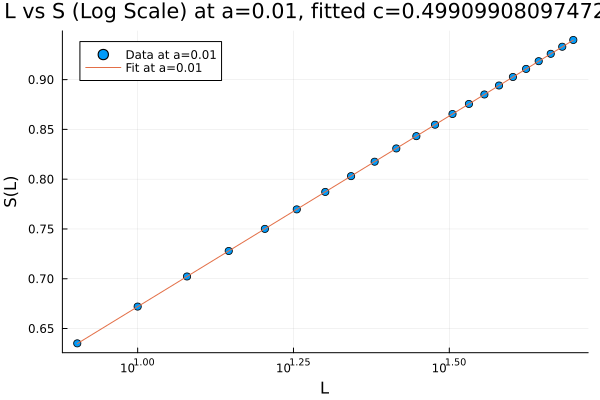

Calculating for a = 0.02, L = 8
Calculating for a = 0.02, L = 10
Calculating for a = 0.02, L = 12
Calculating for a = 0.02, L = 14
Calculating for a = 0.02, L = 16
Calculating for a = 0.02, L = 18
Calculating for a = 0.02, L = 20
Calculating for a = 0.02, L = 22
Calculating for a = 0.02, L = 24
Calculating for a = 0.02, L = 26
Calculating for a = 0.02, L = 28
Calculating for a = 0.02, L = 30
Calculating for a = 0.02, L = 32
Calculating for a = 0.02, L = 34
Calculating for a = 0.02, L = 36
Calculating for a = 0.02, L = 38
Calculating for a = 0.02, L = 40
Calculating for a = 0.02, L = 42
Calculating for a = 0.02, L = 44
Calculating for a = 0.02, L = 46
Calculating for a = 0.02, L = 48
Calculating for a = 0.02, L = 50


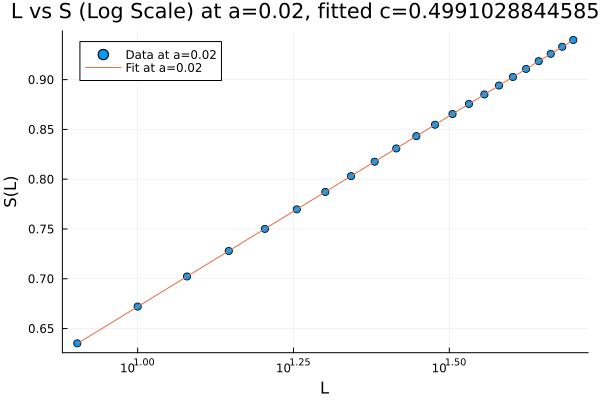

Calculating for a = 0.03, L = 8
Calculating for a = 0.03, L = 10
Calculating for a = 0.03, L = 12
Calculating for a = 0.03, L = 14
Calculating for a = 0.03, L = 16
Calculating for a = 0.03, L = 18
Calculating for a = 0.03, L = 20
Calculating for a = 0.03, L = 22
Calculating for a = 0.03, L = 24
Calculating for a = 0.03, L = 26
Calculating for a = 0.03, L = 28
Calculating for a = 0.03, L = 30
Calculating for a = 0.03, L = 32
Calculating for a = 0.03, L = 34
Calculating for a = 0.03, L = 36
Calculating for a = 0.03, L = 38
Calculating for a = 0.03, L = 40
Calculating for a = 0.03, L = 42
Calculating for a = 0.03, L = 44
Calculating for a = 0.03, L = 46
Calculating for a = 0.03, L = 48
Calculating for a = 0.03, L = 50


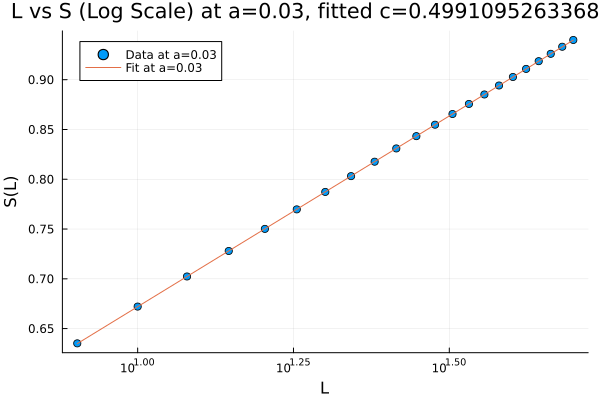

Calculating for a = 0.04, L = 8
Calculating for a = 0.04, L = 10
Calculating for a = 0.04, L = 12
Calculating for a = 0.04, L = 14
Calculating for a = 0.04, L = 16
Calculating for a = 0.04, L = 18
Calculating for a = 0.04, L = 20
Calculating for a = 0.04, L = 22
Calculating for a = 0.04, L = 24
Calculating for a = 0.04, L = 26
Calculating for a = 0.04, L = 28
Calculating for a = 0.04, L = 30
Calculating for a = 0.04, L = 32
Calculating for a = 0.04, L = 34
Calculating for a = 0.04, L = 36
Calculating for a = 0.04, L = 38
Calculating for a = 0.04, L = 40
Calculating for a = 0.04, L = 42
Calculating for a = 0.04, L = 44
Calculating for a = 0.04, L = 46
Calculating for a = 0.04, L = 48
Calculating for a = 0.04, L = 50


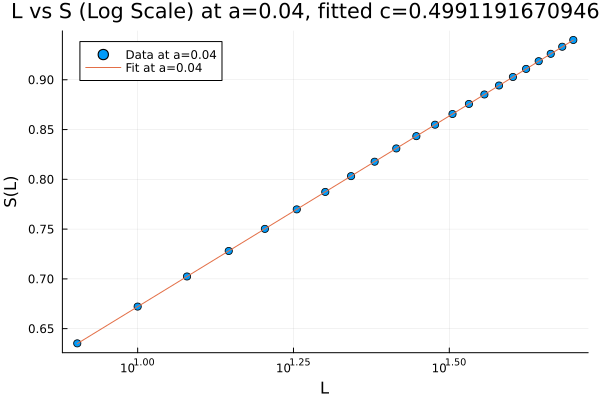

Calculating for a = 0.05, L = 8
Calculating for a = 0.05, L = 10
Calculating for a = 0.05, L = 12
Calculating for a = 0.05, L = 14
Calculating for a = 0.05, L = 16
Calculating for a = 0.05, L = 18
Calculating for a = 0.05, L = 20
Calculating for a = 0.05, L = 22
Calculating for a = 0.05, L = 24
Calculating for a = 0.05, L = 26
Calculating for a = 0.05, L = 28
Calculating for a = 0.05, L = 30
Calculating for a = 0.05, L = 32
Calculating for a = 0.05, L = 34
Calculating for a = 0.05, L = 36
Calculating for a = 0.05, L = 38
Calculating for a = 0.05, L = 40
Calculating for a = 0.05, L = 42
Calculating for a = 0.05, L = 44
Calculating for a = 0.05, L = 46
Calculating for a = 0.05, L = 48
Calculating for a = 0.05, L = 50


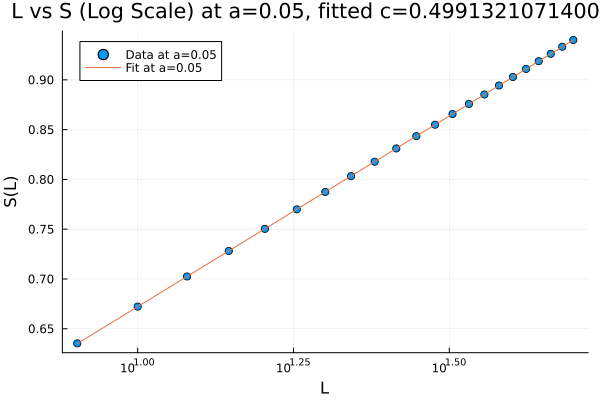

Calculating for a = 0.06, L = 8
Calculating for a = 0.06, L = 10
Calculating for a = 0.06, L = 12
Calculating for a = 0.06, L = 14
Calculating for a = 0.06, L = 16
Calculating for a = 0.06, L = 18
Calculating for a = 0.06, L = 20
Calculating for a = 0.06, L = 22
Calculating for a = 0.06, L = 24
Calculating for a = 0.06, L = 26
Calculating for a = 0.06, L = 28
Calculating for a = 0.06, L = 30
Calculating for a = 0.06, L = 32
Calculating for a = 0.06, L = 34
Calculating for a = 0.06, L = 36
Calculating for a = 0.06, L = 38
Calculating for a = 0.06, L = 40
Calculating for a = 0.06, L = 42
Calculating for a = 0.06, L = 44
Calculating for a = 0.06, L = 46
Calculating for a = 0.06, L = 48
Calculating for a = 0.06, L = 50


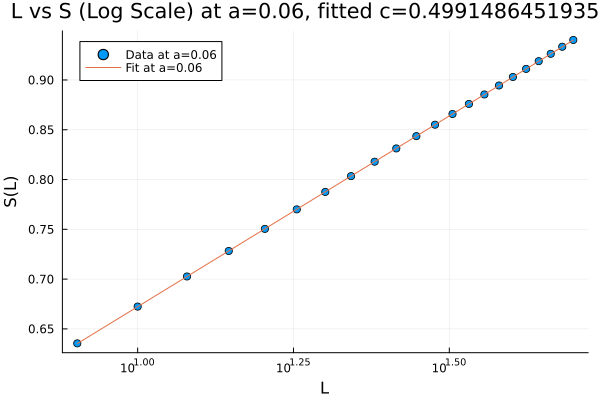

Calculating for a = 0.07, L = 8
Calculating for a = 0.07, L = 10
Calculating for a = 0.07, L = 12
Calculating for a = 0.07, L = 14
Calculating for a = 0.07, L = 16
Calculating for a = 0.07, L = 18
Calculating for a = 0.07, L = 20
Calculating for a = 0.07, L = 22
Calculating for a = 0.07, L = 24
Calculating for a = 0.07, L = 26
Calculating for a = 0.07, L = 28
Calculating for a = 0.07, L = 30
Calculating for a = 0.07, L = 32
Calculating for a = 0.07, L = 34
Calculating for a = 0.07, L = 36
Calculating for a = 0.07, L = 38
Calculating for a = 0.07, L = 40
Calculating for a = 0.07, L = 42
Calculating for a = 0.07, L = 44
Calculating for a = 0.07, L = 46
Calculating for a = 0.07, L = 48
Calculating for a = 0.07, L = 50


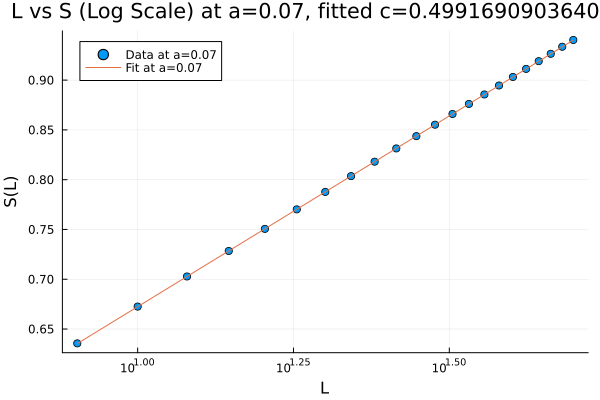

Calculating for a = 0.08, L = 8
Calculating for a = 0.08, L = 10
Calculating for a = 0.08, L = 12
Calculating for a = 0.08, L = 14
Calculating for a = 0.08, L = 16
Calculating for a = 0.08, L = 18
Calculating for a = 0.08, L = 20
Calculating for a = 0.08, L = 22
Calculating for a = 0.08, L = 24
Calculating for a = 0.08, L = 26
Calculating for a = 0.08, L = 28
Calculating for a = 0.08, L = 30
Calculating for a = 0.08, L = 32
Calculating for a = 0.08, L = 34
Calculating for a = 0.08, L = 36
Calculating for a = 0.08, L = 38
Calculating for a = 0.08, L = 40
Calculating for a = 0.08, L = 42
Calculating for a = 0.08, L = 44
Calculating for a = 0.08, L = 46
Calculating for a = 0.08, L = 48
Calculating for a = 0.08, L = 50


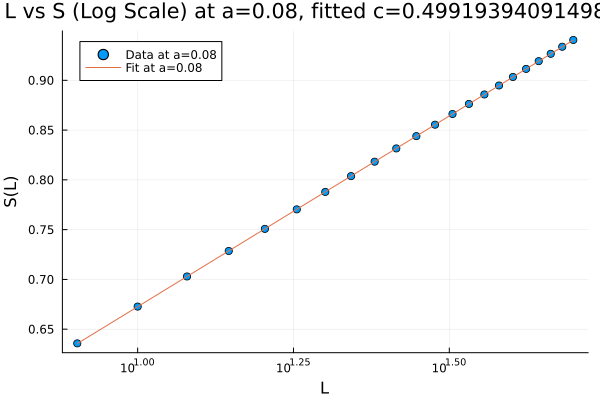

Calculating for a = 0.09, L = 8
Calculating for a = 0.09, L = 10
Calculating for a = 0.09, L = 12
Calculating for a = 0.09, L = 14
Calculating for a = 0.09, L = 16
Calculating for a = 0.09, L = 18
Calculating for a = 0.09, L = 20
Calculating for a = 0.09, L = 22
Calculating for a = 0.09, L = 24
Calculating for a = 0.09, L = 26
Calculating for a = 0.09, L = 28
Calculating for a = 0.09, L = 30
Calculating for a = 0.09, L = 32
Calculating for a = 0.09, L = 34
Calculating for a = 0.09, L = 36
Calculating for a = 0.09, L = 38
Calculating for a = 0.09, L = 40
Calculating for a = 0.09, L = 42
Calculating for a = 0.09, L = 44
Calculating for a = 0.09, L = 46
Calculating for a = 0.09, L = 48
Calculating for a = 0.09, L = 50


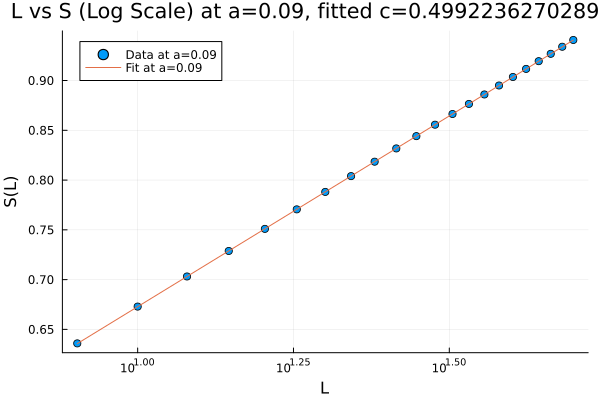

Calculating for a = 0.1, L = 8
Calculating for a = 0.1, L = 10
Calculating for a = 0.1, L = 12
Calculating for a = 0.1, L = 14
Calculating for a = 0.1, L = 16
Calculating for a = 0.1, L = 18
Calculating for a = 0.1, L = 20
Calculating for a = 0.1, L = 22
Calculating for a = 0.1, L = 24
Calculating for a = 0.1, L = 26
Calculating for a = 0.1, L = 28
Calculating for a = 0.1, L = 30
Calculating for a = 0.1, L = 32
Calculating for a = 0.1, L = 34
Calculating for a = 0.1, L = 36
Calculating for a = 0.1, L = 38
Calculating for a = 0.1, L = 40
Calculating for a = 0.1, L = 42
Calculating for a = 0.1, L = 44
Calculating for a = 0.1, L = 46
Calculating for a = 0.1, L = 48
Calculating for a = 0.1, L = 50


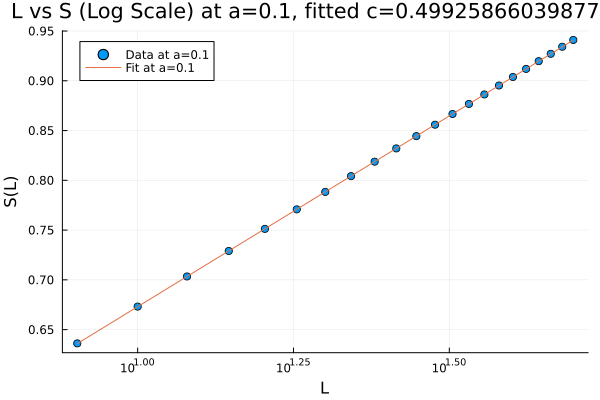

Calculating for a = 0.11, L = 8
Calculating for a = 0.11, L = 10
Calculating for a = 0.11, L = 12
Calculating for a = 0.11, L = 14
Calculating for a = 0.11, L = 16
Calculating for a = 0.11, L = 18
Calculating for a = 0.11, L = 20
Calculating for a = 0.11, L = 22
Calculating for a = 0.11, L = 24
Calculating for a = 0.11, L = 26
Calculating for a = 0.11, L = 28
Calculating for a = 0.11, L = 30
Calculating for a = 0.11, L = 32
Calculating for a = 0.11, L = 34
Calculating for a = 0.11, L = 36
Calculating for a = 0.11, L = 38
Calculating for a = 0.11, L = 40
Calculating for a = 0.11, L = 42
Calculating for a = 0.11, L = 44
Calculating for a = 0.11, L = 46
Calculating for a = 0.11, L = 48
Calculating for a = 0.11, L = 50


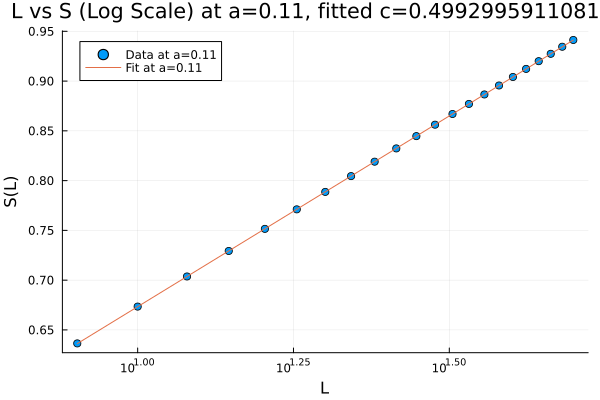

Calculating for a = 0.12, L = 8
Calculating for a = 0.12, L = 10
Calculating for a = 0.12, L = 12
Calculating for a = 0.12, L = 14
Calculating for a = 0.12, L = 16
Calculating for a = 0.12, L = 18
Calculating for a = 0.12, L = 20
Calculating for a = 0.12, L = 22
Calculating for a = 0.12, L = 24
Calculating for a = 0.12, L = 26
Calculating for a = 0.12, L = 28
Calculating for a = 0.12, L = 30
Calculating for a = 0.12, L = 32
Calculating for a = 0.12, L = 34
Calculating for a = 0.12, L = 36
Calculating for a = 0.12, L = 38
Calculating for a = 0.12, L = 40
Calculating for a = 0.12, L = 42
Calculating for a = 0.12, L = 44
Calculating for a = 0.12, L = 46
Calculating for a = 0.12, L = 48
Calculating for a = 0.12, L = 50


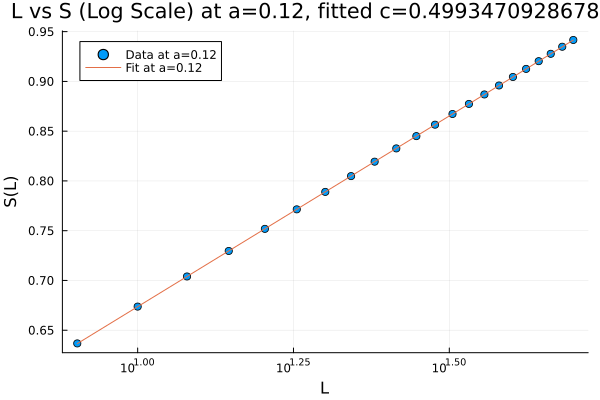

Calculating for a = 0.13, L = 8
Calculating for a = 0.13, L = 10
Calculating for a = 0.13, L = 12
Calculating for a = 0.13, L = 14
Calculating for a = 0.13, L = 16
Calculating for a = 0.13, L = 18
Calculating for a = 0.13, L = 20
Calculating for a = 0.13, L = 22
Calculating for a = 0.13, L = 24
Calculating for a = 0.13, L = 26
Calculating for a = 0.13, L = 28
Calculating for a = 0.13, L = 30
Calculating for a = 0.13, L = 32
Calculating for a = 0.13, L = 34
Calculating for a = 0.13, L = 36
Calculating for a = 0.13, L = 38
Calculating for a = 0.13, L = 40
Calculating for a = 0.13, L = 42
Calculating for a = 0.13, L = 44
Calculating for a = 0.13, L = 46
Calculating for a = 0.13, L = 48
Calculating for a = 0.13, L = 50


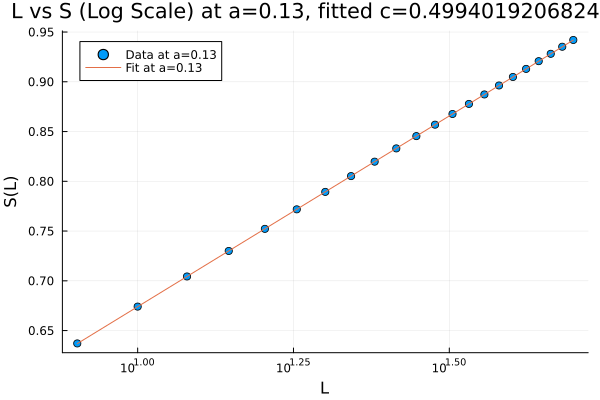

Calculating for a = 0.14, L = 8
Calculating for a = 0.14, L = 10
Calculating for a = 0.14, L = 12
Calculating for a = 0.14, L = 14
Calculating for a = 0.14, L = 16
Calculating for a = 0.14, L = 18
Calculating for a = 0.14, L = 20
Calculating for a = 0.14, L = 22
Calculating for a = 0.14, L = 24
Calculating for a = 0.14, L = 26
Calculating for a = 0.14, L = 28
Calculating for a = 0.14, L = 30
Calculating for a = 0.14, L = 32
Calculating for a = 0.14, L = 34
Calculating for a = 0.14, L = 36
Calculating for a = 0.14, L = 38
Calculating for a = 0.14, L = 40
Calculating for a = 0.14, L = 42
Calculating for a = 0.14, L = 44
Calculating for a = 0.14, L = 46
Calculating for a = 0.14, L = 48
Calculating for a = 0.14, L = 50


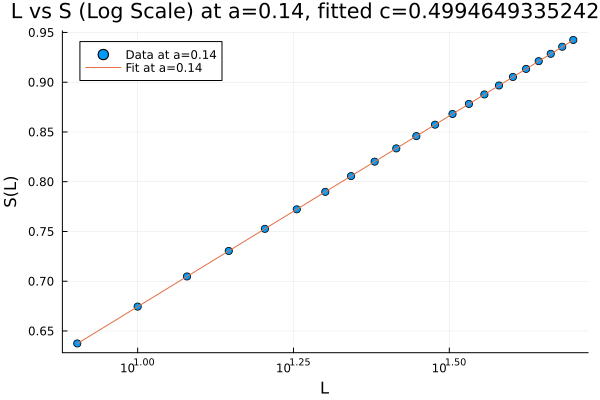

Calculating for a = 0.15, L = 8
Calculating for a = 0.15, L = 10
Calculating for a = 0.15, L = 12
Calculating for a = 0.15, L = 14
Calculating for a = 0.15, L = 16
Calculating for a = 0.15, L = 18
Calculating for a = 0.15, L = 20
Calculating for a = 0.15, L = 22
Calculating for a = 0.15, L = 24
Calculating for a = 0.15, L = 26
Calculating for a = 0.15, L = 28
Calculating for a = 0.15, L = 30
Calculating for a = 0.15, L = 32
Calculating for a = 0.15, L = 34
Calculating for a = 0.15, L = 36
Calculating for a = 0.15, L = 38
Calculating for a = 0.15, L = 40
Calculating for a = 0.15, L = 42
Calculating for a = 0.15, L = 44
Calculating for a = 0.15, L = 46
Calculating for a = 0.15, L = 48
Calculating for a = 0.15, L = 50


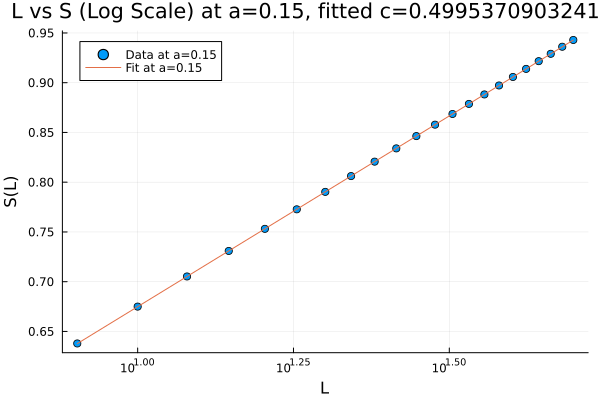

Calculating for a = 0.16, L = 8
Calculating for a = 0.16, L = 10
Calculating for a = 0.16, L = 12
Calculating for a = 0.16, L = 14
Calculating for a = 0.16, L = 16
Calculating for a = 0.16, L = 18
Calculating for a = 0.16, L = 20
Calculating for a = 0.16, L = 22
Calculating for a = 0.16, L = 24
Calculating for a = 0.16, L = 26
Calculating for a = 0.16, L = 28
Calculating for a = 0.16, L = 30
Calculating for a = 0.16, L = 32
Calculating for a = 0.16, L = 34
Calculating for a = 0.16, L = 36
Calculating for a = 0.16, L = 38
Calculating for a = 0.16, L = 40
Calculating for a = 0.16, L = 42
Calculating for a = 0.16, L = 44
Calculating for a = 0.16, L = 46
Calculating for a = 0.16, L = 48
Calculating for a = 0.16, L = 50


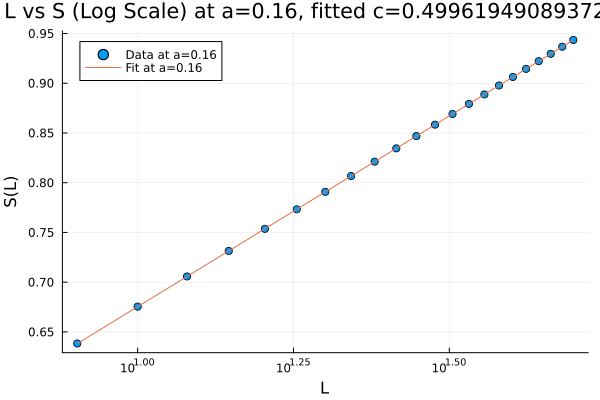

Calculating for a = 0.17, L = 8
Calculating for a = 0.17, L = 10
Calculating for a = 0.17, L = 12
Calculating for a = 0.17, L = 14
Calculating for a = 0.17, L = 16
Calculating for a = 0.17, L = 18
Calculating for a = 0.17, L = 20
Calculating for a = 0.17, L = 22
Calculating for a = 0.17, L = 24
Calculating for a = 0.17, L = 26
Calculating for a = 0.17, L = 28
Calculating for a = 0.17, L = 30
Calculating for a = 0.17, L = 32
Calculating for a = 0.17, L = 34
Calculating for a = 0.17, L = 36
Calculating for a = 0.17, L = 38
Calculating for a = 0.17, L = 40
Calculating for a = 0.17, L = 42
Calculating for a = 0.17, L = 44
Calculating for a = 0.17, L = 46
Calculating for a = 0.17, L = 48
Calculating for a = 0.17, L = 50


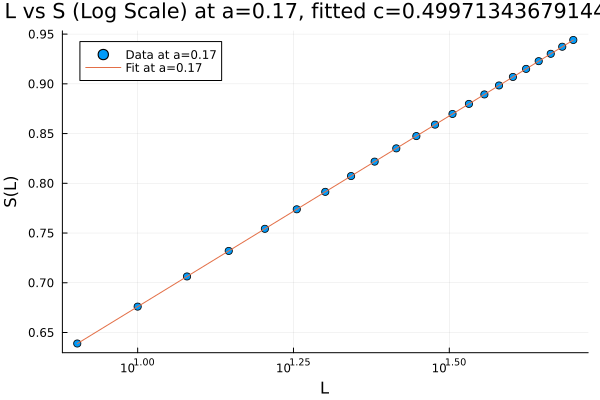

Calculating for a = 0.18, L = 8
Calculating for a = 0.18, L = 10
Calculating for a = 0.18, L = 12
Calculating for a = 0.18, L = 14
Calculating for a = 0.18, L = 16
Calculating for a = 0.18, L = 18
Calculating for a = 0.18, L = 20
Calculating for a = 0.18, L = 22
Calculating for a = 0.18, L = 24
Calculating for a = 0.18, L = 26
Calculating for a = 0.18, L = 28
Calculating for a = 0.18, L = 30
Calculating for a = 0.18, L = 32
Calculating for a = 0.18, L = 34
Calculating for a = 0.18, L = 36
Calculating for a = 0.18, L = 38
Calculating for a = 0.18, L = 40
Calculating for a = 0.18, L = 42
Calculating for a = 0.18, L = 44
Calculating for a = 0.18, L = 46
Calculating for a = 0.18, L = 48
Calculating for a = 0.18, L = 50


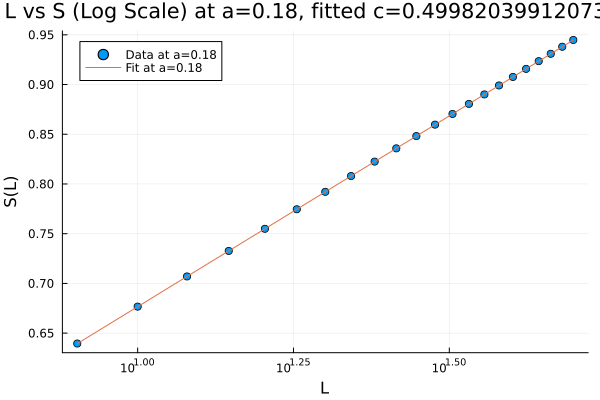

Calculating for a = 0.19, L = 8
Calculating for a = 0.19, L = 10
Calculating for a = 0.19, L = 12
Calculating for a = 0.19, L = 14
Calculating for a = 0.19, L = 16
Calculating for a = 0.19, L = 18
Calculating for a = 0.19, L = 20
Calculating for a = 0.19, L = 22
Calculating for a = 0.19, L = 24
Calculating for a = 0.19, L = 26
Calculating for a = 0.19, L = 28
Calculating for a = 0.19, L = 30
Calculating for a = 0.19, L = 32
Calculating for a = 0.19, L = 34
Calculating for a = 0.19, L = 36
Calculating for a = 0.19, L = 38
Calculating for a = 0.19, L = 40
Calculating for a = 0.19, L = 42
Calculating for a = 0.19, L = 44
Calculating for a = 0.19, L = 46
Calculating for a = 0.19, L = 48
Calculating for a = 0.19, L = 50


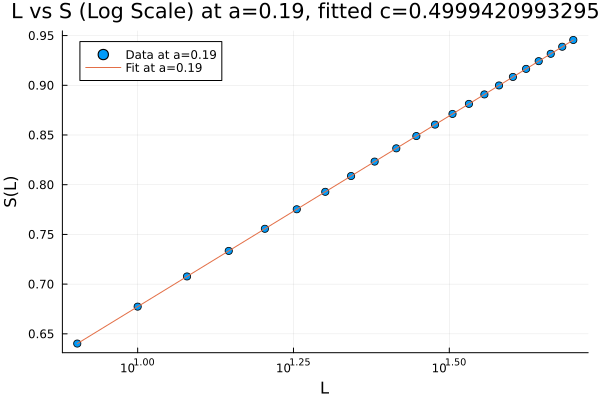

Calculating for a = 0.2, L = 8
Calculating for a = 0.2, L = 10
Calculating for a = 0.2, L = 12
Calculating for a = 0.2, L = 14
Calculating for a = 0.2, L = 16
Calculating for a = 0.2, L = 18
Calculating for a = 0.2, L = 20
Calculating for a = 0.2, L = 22
Calculating for a = 0.2, L = 24
Calculating for a = 0.2, L = 26
Calculating for a = 0.2, L = 28
Calculating for a = 0.2, L = 30
Calculating for a = 0.2, L = 32
Calculating for a = 0.2, L = 34
Calculating for a = 0.2, L = 36
Calculating for a = 0.2, L = 38
Calculating for a = 0.2, L = 40
Calculating for a = 0.2, L = 42
Calculating for a = 0.2, L = 44
Calculating for a = 0.2, L = 46
Calculating for a = 0.2, L = 48
Calculating for a = 0.2, L = 50


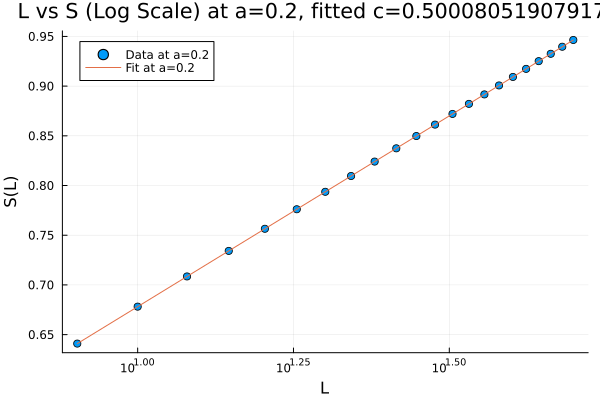

Calculating for a = 0.21, L = 8
Calculating for a = 0.21, L = 10
Calculating for a = 0.21, L = 12
Calculating for a = 0.21, L = 14
Calculating for a = 0.21, L = 16
Calculating for a = 0.21, L = 18
Calculating for a = 0.21, L = 20
Calculating for a = 0.21, L = 22
Calculating for a = 0.21, L = 24
Calculating for a = 0.21, L = 26
Calculating for a = 0.21, L = 28
Calculating for a = 0.21, L = 30
Calculating for a = 0.21, L = 32
Calculating for a = 0.21, L = 34
Calculating for a = 0.21, L = 36
Calculating for a = 0.21, L = 38
Calculating for a = 0.21, L = 40
Calculating for a = 0.21, L = 42
Calculating for a = 0.21, L = 44
Calculating for a = 0.21, L = 46
Calculating for a = 0.21, L = 48
Calculating for a = 0.21, L = 50


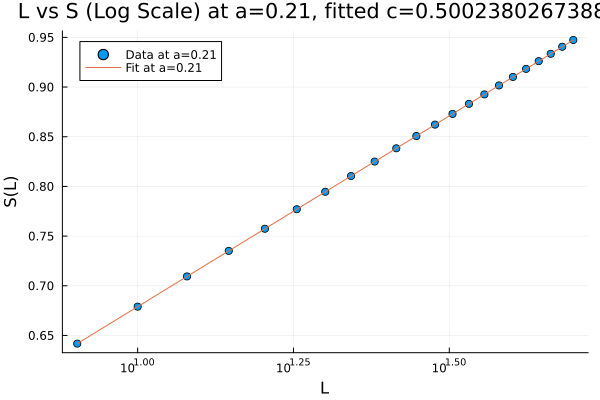

Calculating for a = 0.22, L = 8
Calculating for a = 0.22, L = 10
Calculating for a = 0.22, L = 12
Calculating for a = 0.22, L = 14
Calculating for a = 0.22, L = 16
Calculating for a = 0.22, L = 18
Calculating for a = 0.22, L = 20
Calculating for a = 0.22, L = 22
Calculating for a = 0.22, L = 24
Calculating for a = 0.22, L = 26
Calculating for a = 0.22, L = 28
Calculating for a = 0.22, L = 30
Calculating for a = 0.22, L = 32
Calculating for a = 0.22, L = 34
Calculating for a = 0.22, L = 36
Calculating for a = 0.22, L = 38
Calculating for a = 0.22, L = 40
Calculating for a = 0.22, L = 42
Calculating for a = 0.22, L = 44
Calculating for a = 0.22, L = 46
Calculating for a = 0.22, L = 48
Calculating for a = 0.22, L = 50


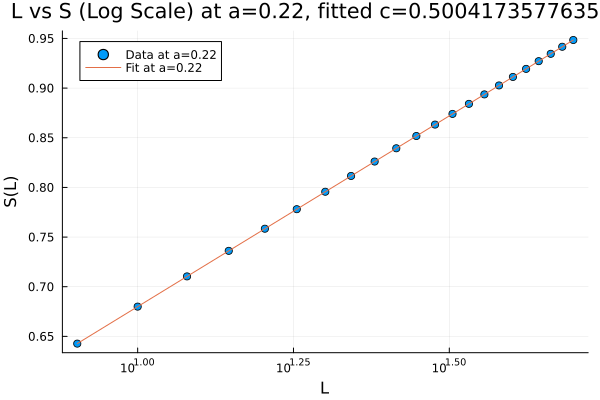

Calculating for a = 0.23, L = 8
Calculating for a = 0.23, L = 10
Calculating for a = 0.23, L = 12
Calculating for a = 0.23, L = 14
Calculating for a = 0.23, L = 16
Calculating for a = 0.23, L = 18
Calculating for a = 0.23, L = 20
Calculating for a = 0.23, L = 22
Calculating for a = 0.23, L = 24
Calculating for a = 0.23, L = 26
Calculating for a = 0.23, L = 28
Calculating for a = 0.23, L = 30
Calculating for a = 0.23, L = 32
Calculating for a = 0.23, L = 34
Calculating for a = 0.23, L = 36
Calculating for a = 0.23, L = 38
Calculating for a = 0.23, L = 40
Calculating for a = 0.23, L = 42
Calculating for a = 0.23, L = 44
Calculating for a = 0.23, L = 46
Calculating for a = 0.23, L = 48
Calculating for a = 0.23, L = 50


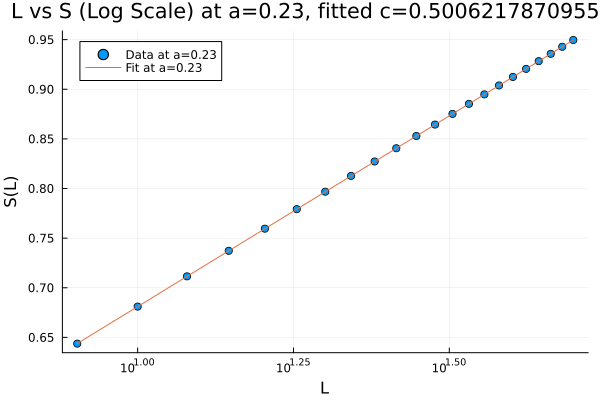

Calculating for a = 0.24, L = 8
Calculating for a = 0.24, L = 10
Calculating for a = 0.24, L = 12
Calculating for a = 0.24, L = 14
Calculating for a = 0.24, L = 16
Calculating for a = 0.24, L = 18
Calculating for a = 0.24, L = 20
Calculating for a = 0.24, L = 22
Calculating for a = 0.24, L = 24
Calculating for a = 0.24, L = 26
Calculating for a = 0.24, L = 28
Calculating for a = 0.24, L = 30
Calculating for a = 0.24, L = 32
Calculating for a = 0.24, L = 34
Calculating for a = 0.24, L = 36
Calculating for a = 0.24, L = 38
Calculating for a = 0.24, L = 40
Calculating for a = 0.24, L = 42
Calculating for a = 0.24, L = 44
Calculating for a = 0.24, L = 46
Calculating for a = 0.24, L = 48
Calculating for a = 0.24, L = 50


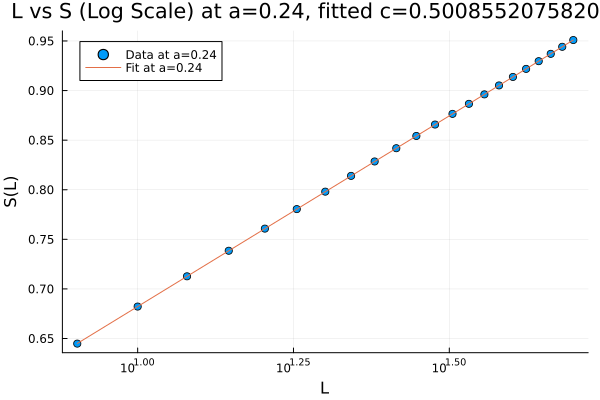

Calculating for a = 0.25, L = 8
Calculating for a = 0.25, L = 10
Calculating for a = 0.25, L = 12
Calculating for a = 0.25, L = 14
Calculating for a = 0.25, L = 16
Calculating for a = 0.25, L = 18
Calculating for a = 0.25, L = 20
Calculating for a = 0.25, L = 22
Calculating for a = 0.25, L = 24
Calculating for a = 0.25, L = 26
Calculating for a = 0.25, L = 28
Calculating for a = 0.25, L = 30
Calculating for a = 0.25, L = 32
Calculating for a = 0.25, L = 34
Calculating for a = 0.25, L = 36
Calculating for a = 0.25, L = 38
Calculating for a = 0.25, L = 40
Calculating for a = 0.25, L = 42
Calculating for a = 0.25, L = 44
Calculating for a = 0.25, L = 46
Calculating for a = 0.25, L = 48
Calculating for a = 0.25, L = 50


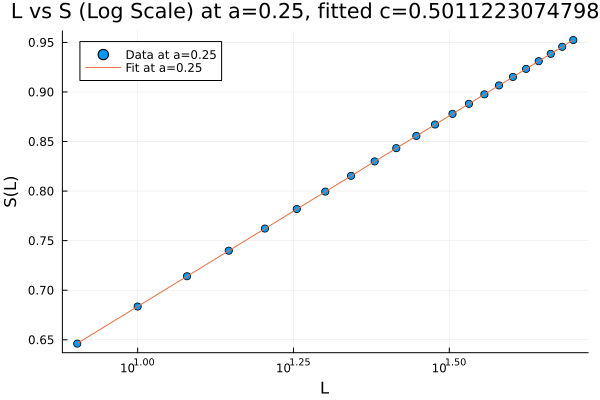

Calculating for a = 0.26, L = 8
Calculating for a = 0.26, L = 10
Calculating for a = 0.26, L = 12
Calculating for a = 0.26, L = 14
Calculating for a = 0.26, L = 16
Calculating for a = 0.26, L = 18
Calculating for a = 0.26, L = 20
Calculating for a = 0.26, L = 22
Calculating for a = 0.26, L = 24
Calculating for a = 0.26, L = 26
Calculating for a = 0.26, L = 28
Calculating for a = 0.26, L = 30
Calculating for a = 0.26, L = 32
Calculating for a = 0.26, L = 34
Calculating for a = 0.26, L = 36
Calculating for a = 0.26, L = 38
Calculating for a = 0.26, L = 40
Calculating for a = 0.26, L = 42
Calculating for a = 0.26, L = 44
Calculating for a = 0.26, L = 46
Calculating for a = 0.26, L = 48
Calculating for a = 0.26, L = 50


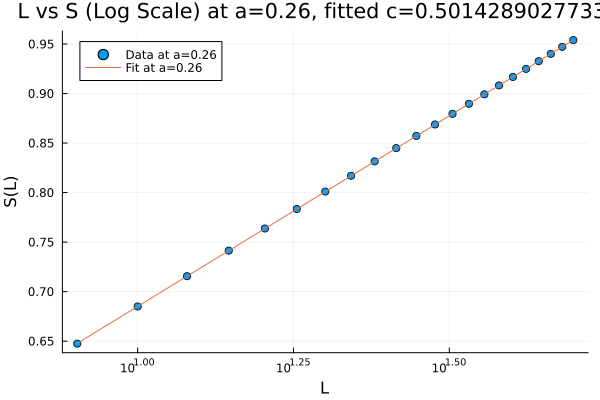

Calculating for a = 0.27, L = 8
Calculating for a = 0.27, L = 10
Calculating for a = 0.27, L = 12
Calculating for a = 0.27, L = 14
Calculating for a = 0.27, L = 16
Calculating for a = 0.27, L = 18
Calculating for a = 0.27, L = 20
Calculating for a = 0.27, L = 22
Calculating for a = 0.27, L = 24
Calculating for a = 0.27, L = 26
Calculating for a = 0.27, L = 28
Calculating for a = 0.27, L = 30
Calculating for a = 0.27, L = 32
Calculating for a = 0.27, L = 34
Calculating for a = 0.27, L = 36
Calculating for a = 0.27, L = 38
Calculating for a = 0.27, L = 40
Calculating for a = 0.27, L = 42
Calculating for a = 0.27, L = 44
Calculating for a = 0.27, L = 46
Calculating for a = 0.27, L = 48
Calculating for a = 0.27, L = 50


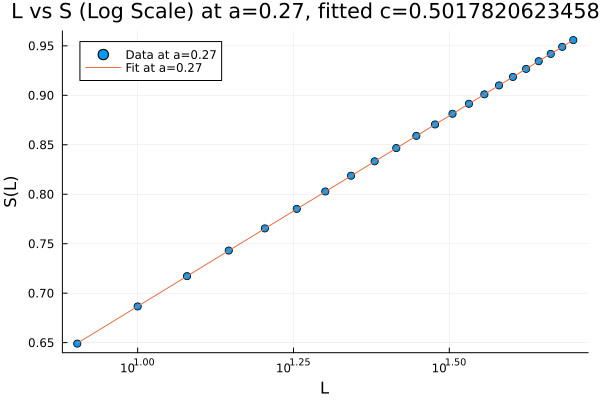

Calculating for a = 0.28, L = 8
Calculating for a = 0.28, L = 10
Calculating for a = 0.28, L = 12
Calculating for a = 0.28, L = 14
Calculating for a = 0.28, L = 16
Calculating for a = 0.28, L = 18
Calculating for a = 0.28, L = 20
Calculating for a = 0.28, L = 22
Calculating for a = 0.28, L = 24
Calculating for a = 0.28, L = 26
Calculating for a = 0.28, L = 28
Calculating for a = 0.28, L = 30
Calculating for a = 0.28, L = 32
Calculating for a = 0.28, L = 34
Calculating for a = 0.28, L = 36
Calculating for a = 0.28, L = 38
Calculating for a = 0.28, L = 40
Calculating for a = 0.28, L = 42
Calculating for a = 0.28, L = 44
Calculating for a = 0.28, L = 46
Calculating for a = 0.28, L = 48
Calculating for a = 0.28, L = 50


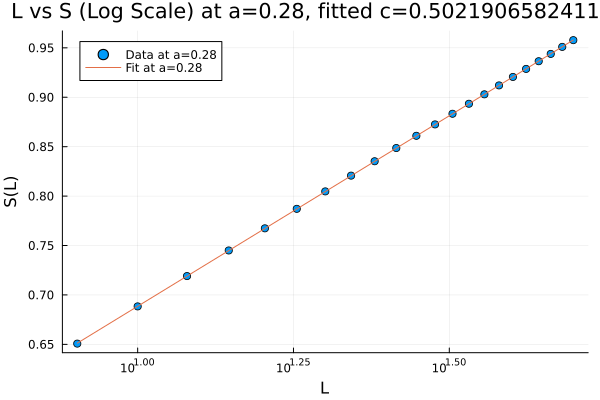

Calculating for a = 0.29, L = 8
Calculating for a = 0.29, L = 10
Calculating for a = 0.29, L = 12
Calculating for a = 0.29, L = 14
Calculating for a = 0.29, L = 16
Calculating for a = 0.29, L = 18
Calculating for a = 0.29, L = 20
Calculating for a = 0.29, L = 22
Calculating for a = 0.29, L = 24
Calculating for a = 0.29, L = 26
Calculating for a = 0.29, L = 28
Calculating for a = 0.29, L = 30
Calculating for a = 0.29, L = 32
Calculating for a = 0.29, L = 34
Calculating for a = 0.29, L = 36
Calculating for a = 0.29, L = 38
Calculating for a = 0.29, L = 40
Calculating for a = 0.29, L = 42
Calculating for a = 0.29, L = 44
Calculating for a = 0.29, L = 46
Calculating for a = 0.29, L = 48
Calculating for a = 0.29, L = 50


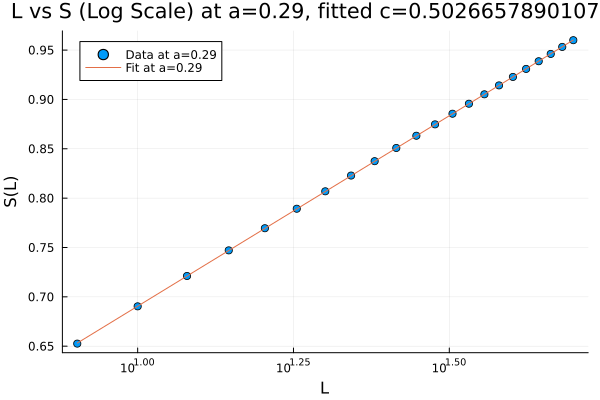

Calculating for a = 0.3, L = 8
Calculating for a = 0.3, L = 10
Calculating for a = 0.3, L = 12
Calculating for a = 0.3, L = 14
Calculating for a = 0.3, L = 16
Calculating for a = 0.3, L = 18
Calculating for a = 0.3, L = 20
Calculating for a = 0.3, L = 22
Calculating for a = 0.3, L = 24
Calculating for a = 0.3, L = 26
Calculating for a = 0.3, L = 28
Calculating for a = 0.3, L = 30
Calculating for a = 0.3, L = 32
Calculating for a = 0.3, L = 34
Calculating for a = 0.3, L = 36
Calculating for a = 0.3, L = 38
Calculating for a = 0.3, L = 40
Calculating for a = 0.3, L = 42
Calculating for a = 0.3, L = 44
Calculating for a = 0.3, L = 46
Calculating for a = 0.3, L = 48
Calculating for a = 0.3, L = 50


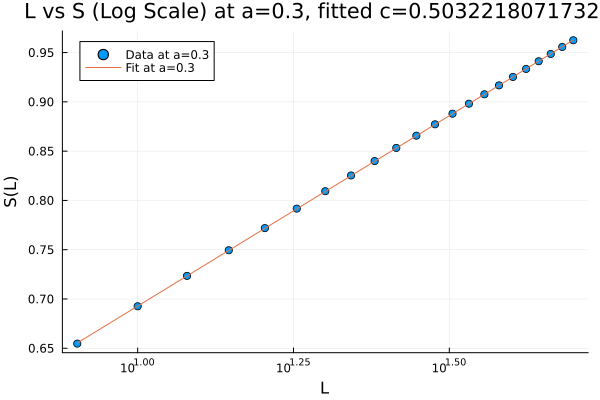

Calculating for a = 0.31, L = 8
Calculating for a = 0.31, L = 10
Calculating for a = 0.31, L = 12
Calculating for a = 0.31, L = 14
Calculating for a = 0.31, L = 16
Calculating for a = 0.31, L = 18
Calculating for a = 0.31, L = 20
Calculating for a = 0.31, L = 22
Calculating for a = 0.31, L = 24
Calculating for a = 0.31, L = 26
Calculating for a = 0.31, L = 28
Calculating for a = 0.31, L = 30
Calculating for a = 0.31, L = 32
Calculating for a = 0.31, L = 34
Calculating for a = 0.31, L = 36
Calculating for a = 0.31, L = 38
Calculating for a = 0.31, L = 40
Calculating for a = 0.31, L = 42
Calculating for a = 0.31, L = 44
Calculating for a = 0.31, L = 46
Calculating for a = 0.31, L = 48
Calculating for a = 0.31, L = 50


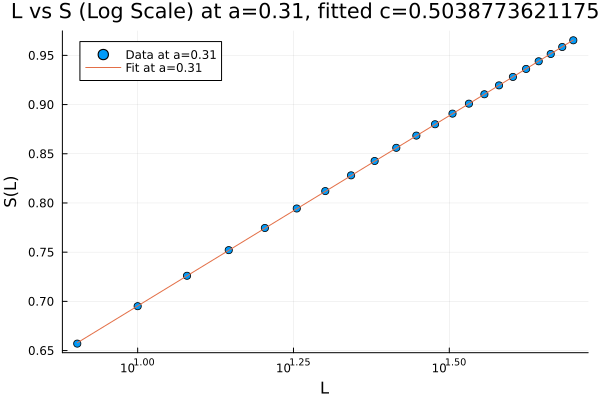

Calculating for a = 0.32, L = 8
Calculating for a = 0.32, L = 10
Calculating for a = 0.32, L = 12
Calculating for a = 0.32, L = 14
Calculating for a = 0.32, L = 16
Calculating for a = 0.32, L = 18
Calculating for a = 0.32, L = 20
Calculating for a = 0.32, L = 22
Calculating for a = 0.32, L = 24
Calculating for a = 0.32, L = 26
Calculating for a = 0.32, L = 28
Calculating for a = 0.32, L = 30
Calculating for a = 0.32, L = 32
Calculating for a = 0.32, L = 34
Calculating for a = 0.32, L = 36
Calculating for a = 0.32, L = 38
Calculating for a = 0.32, L = 40
Calculating for a = 0.32, L = 42
Calculating for a = 0.32, L = 44
Calculating for a = 0.32, L = 46
Calculating for a = 0.32, L = 48
Calculating for a = 0.32, L = 50


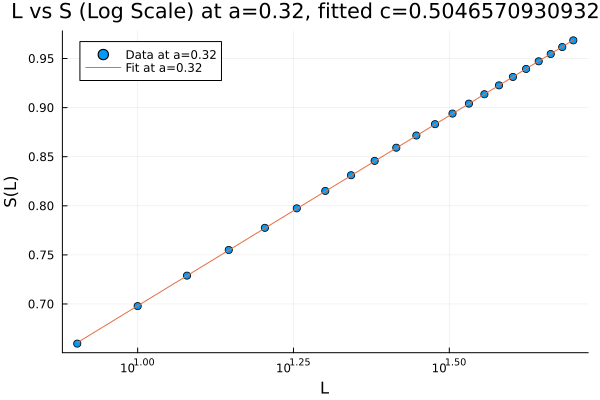

Calculating for a = 0.33, L = 8
Calculating for a = 0.33, L = 10
Calculating for a = 0.33, L = 12
Calculating for a = 0.33, L = 14
Calculating for a = 0.33, L = 16
Calculating for a = 0.33, L = 18
Calculating for a = 0.33, L = 20
Calculating for a = 0.33, L = 22
Calculating for a = 0.33, L = 24
Calculating for a = 0.33, L = 26
Calculating for a = 0.33, L = 28
Calculating for a = 0.33, L = 30
Calculating for a = 0.33, L = 32
Calculating for a = 0.33, L = 34
Calculating for a = 0.33, L = 36
Calculating for a = 0.33, L = 38
Calculating for a = 0.33, L = 40
Calculating for a = 0.33, L = 42
Calculating for a = 0.33, L = 44
Calculating for a = 0.33, L = 46
Calculating for a = 0.33, L = 48
Calculating for a = 0.33, L = 50


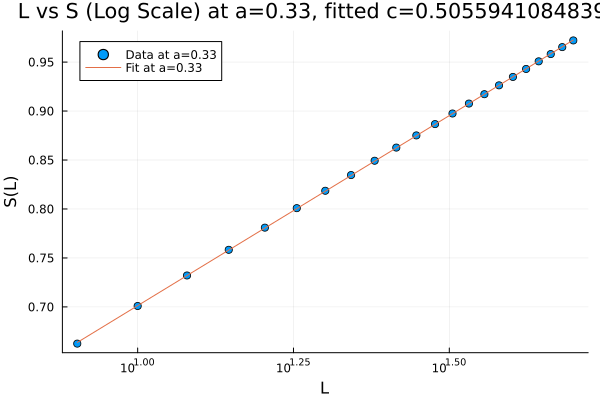

Calculating for a = 0.34, L = 8
Calculating for a = 0.34, L = 10
Calculating for a = 0.34, L = 12
Calculating for a = 0.34, L = 14
Calculating for a = 0.34, L = 16
Calculating for a = 0.34, L = 18
Calculating for a = 0.34, L = 20
Calculating for a = 0.34, L = 22
Calculating for a = 0.34, L = 24
Calculating for a = 0.34, L = 26
Calculating for a = 0.34, L = 28
Calculating for a = 0.34, L = 30
Calculating for a = 0.34, L = 32
Calculating for a = 0.34, L = 34
Calculating for a = 0.34, L = 36
Calculating for a = 0.34, L = 38
Calculating for a = 0.34, L = 40
Calculating for a = 0.34, L = 42
Calculating for a = 0.34, L = 44
Calculating for a = 0.34, L = 46
Calculating for a = 0.34, L = 48
Calculating for a = 0.34, L = 50


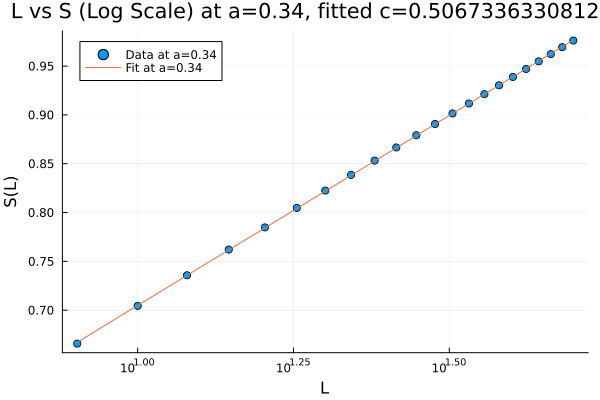

Calculating for a = 0.35, L = 8
Calculating for a = 0.35, L = 10
Calculating for a = 0.35, L = 12
Calculating for a = 0.35, L = 14
Calculating for a = 0.35, L = 16
Calculating for a = 0.35, L = 18
Calculating for a = 0.35, L = 20
Calculating for a = 0.35, L = 22
Calculating for a = 0.35, L = 24
Calculating for a = 0.35, L = 26
Calculating for a = 0.35, L = 28
Calculating for a = 0.35, L = 30
Calculating for a = 0.35, L = 32
Calculating for a = 0.35, L = 34
Calculating for a = 0.35, L = 36
Calculating for a = 0.35, L = 38
Calculating for a = 0.35, L = 40
Calculating for a = 0.35, L = 42
Calculating for a = 0.35, L = 44
Calculating for a = 0.35, L = 46
Calculating for a = 0.35, L = 48
Calculating for a = 0.35, L = 50


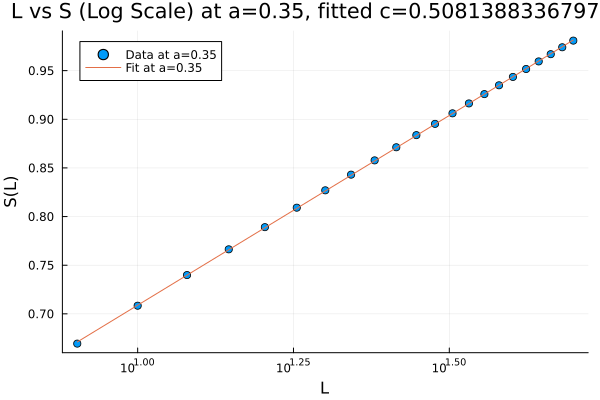

Calculating for a = 0.36, L = 8
Calculating for a = 0.36, L = 10
Calculating for a = 0.36, L = 12
Calculating for a = 0.36, L = 14
Calculating for a = 0.36, L = 16
Calculating for a = 0.36, L = 18
Calculating for a = 0.36, L = 20
Calculating for a = 0.36, L = 22
Calculating for a = 0.36, L = 24
Calculating for a = 0.36, L = 26
Calculating for a = 0.36, L = 28
Calculating for a = 0.36, L = 30
Calculating for a = 0.36, L = 32
Calculating for a = 0.36, L = 34
Calculating for a = 0.36, L = 36
Calculating for a = 0.36, L = 38
Calculating for a = 0.36, L = 40
Calculating for a = 0.36, L = 42
Calculating for a = 0.36, L = 44
Calculating for a = 0.36, L = 46
Calculating for a = 0.36, L = 48
Calculating for a = 0.36, L = 50


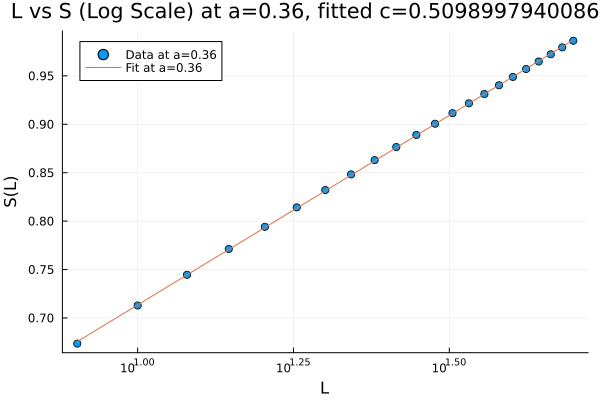

Calculating for a = 0.37, L = 8
Calculating for a = 0.37, L = 10
Calculating for a = 0.37, L = 12
Calculating for a = 0.37, L = 14
Calculating for a = 0.37, L = 16
Calculating for a = 0.37, L = 18
Calculating for a = 0.37, L = 20
Calculating for a = 0.37, L = 22
Calculating for a = 0.37, L = 24
Calculating for a = 0.37, L = 26
Calculating for a = 0.37, L = 28
Calculating for a = 0.37, L = 30
Calculating for a = 0.37, L = 32
Calculating for a = 0.37, L = 34
Calculating for a = 0.37, L = 36
Calculating for a = 0.37, L = 38
Calculating for a = 0.37, L = 40
Calculating for a = 0.37, L = 42
Calculating for a = 0.37, L = 44
Calculating for a = 0.37, L = 46
Calculating for a = 0.37, L = 48
Calculating for a = 0.37, L = 50


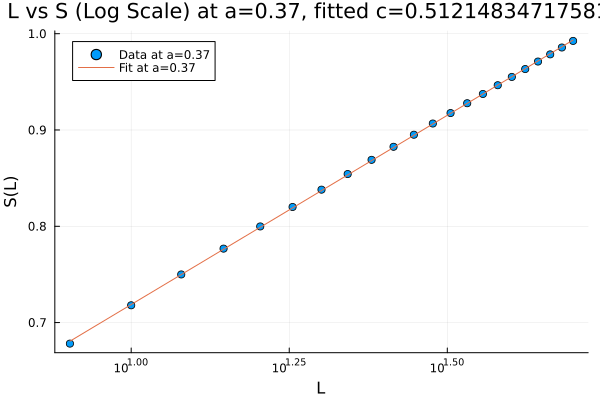

Calculating for a = 0.38, L = 8
Calculating for a = 0.38, L = 10
Calculating for a = 0.38, L = 12
Calculating for a = 0.38, L = 14
Calculating for a = 0.38, L = 16
Calculating for a = 0.38, L = 18
Calculating for a = 0.38, L = 20
Calculating for a = 0.38, L = 22
Calculating for a = 0.38, L = 24
Calculating for a = 0.38, L = 26
Calculating for a = 0.38, L = 28
Calculating for a = 0.38, L = 30
Calculating for a = 0.38, L = 32
Calculating for a = 0.38, L = 34
Calculating for a = 0.38, L = 36
Calculating for a = 0.38, L = 38
Calculating for a = 0.38, L = 40
Calculating for a = 0.38, L = 42
Calculating for a = 0.38, L = 44
Calculating for a = 0.38, L = 46
Calculating for a = 0.38, L = 48
Calculating for a = 0.38, L = 50


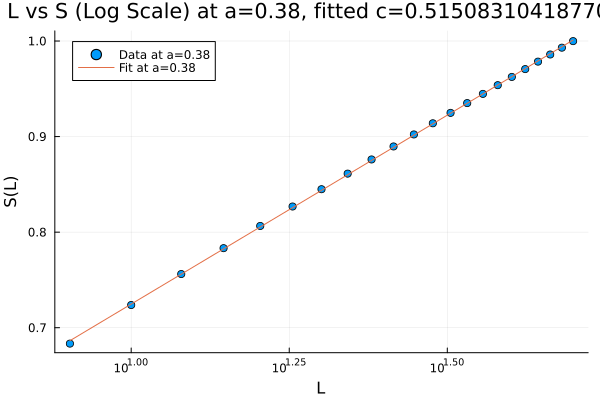

Calculating for a = 0.39, L = 8
Calculating for a = 0.39, L = 10
Calculating for a = 0.39, L = 12
Calculating for a = 0.39, L = 14
Calculating for a = 0.39, L = 16
Calculating for a = 0.39, L = 18
Calculating for a = 0.39, L = 20
Calculating for a = 0.39, L = 22
Calculating for a = 0.39, L = 24
Calculating for a = 0.39, L = 26
Calculating for a = 0.39, L = 28
Calculating for a = 0.39, L = 30
Calculating for a = 0.39, L = 32
Calculating for a = 0.39, L = 34
Calculating for a = 0.39, L = 36
Calculating for a = 0.39, L = 38
Calculating for a = 0.39, L = 40
Calculating for a = 0.39, L = 42
Calculating for a = 0.39, L = 44
Calculating for a = 0.39, L = 46
Calculating for a = 0.39, L = 48
Calculating for a = 0.39, L = 50


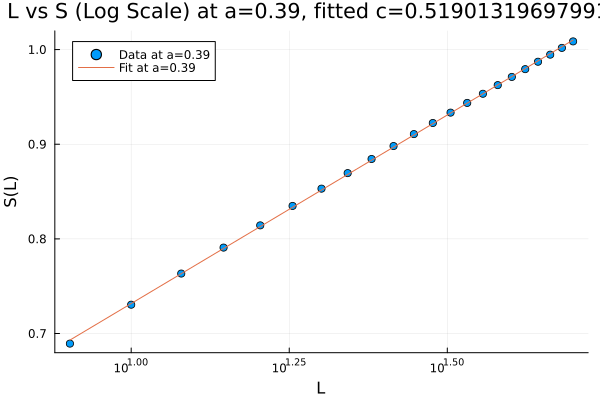

Calculating for a = 0.4, L = 8
Calculating for a = 0.4, L = 10
Calculating for a = 0.4, L = 12
Calculating for a = 0.4, L = 14
Calculating for a = 0.4, L = 16
Calculating for a = 0.4, L = 18
Calculating for a = 0.4, L = 20
Calculating for a = 0.4, L = 22
Calculating for a = 0.4, L = 24
Calculating for a = 0.4, L = 26
Calculating for a = 0.4, L = 28
Calculating for a = 0.4, L = 30
Calculating for a = 0.4, L = 32
Calculating for a = 0.4, L = 34
Calculating for a = 0.4, L = 36
Calculating for a = 0.4, L = 38
Calculating for a = 0.4, L = 40
Calculating for a = 0.4, L = 42
Calculating for a = 0.4, L = 44
Calculating for a = 0.4, L = 46
Calculating for a = 0.4, L = 48
Calculating for a = 0.4, L = 50


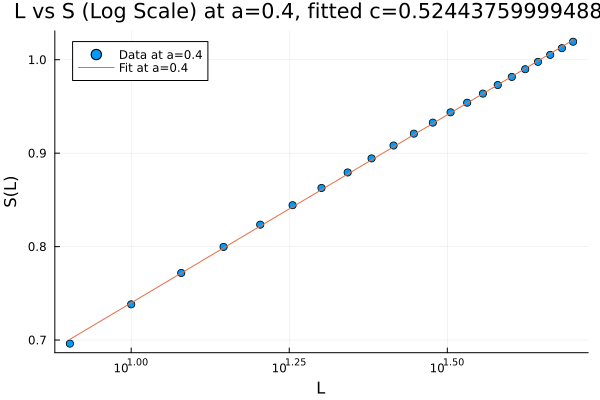

Calculating for a = 0.41, L = 8
Calculating for a = 0.41, L = 10
Calculating for a = 0.41, L = 12
Calculating for a = 0.41, L = 14
Calculating for a = 0.41, L = 16
Calculating for a = 0.41, L = 18
Calculating for a = 0.41, L = 20
Calculating for a = 0.41, L = 22
Calculating for a = 0.41, L = 24
Calculating for a = 0.41, L = 26
Calculating for a = 0.41, L = 28
Calculating for a = 0.41, L = 30
Calculating for a = 0.41, L = 32
Calculating for a = 0.41, L = 34
Calculating for a = 0.41, L = 36
Calculating for a = 0.41, L = 38
Calculating for a = 0.41, L = 40
Calculating for a = 0.41, L = 42
Calculating for a = 0.41, L = 44
Calculating for a = 0.41, L = 46
Calculating for a = 0.41, L = 48
Calculating for a = 0.41, L = 50


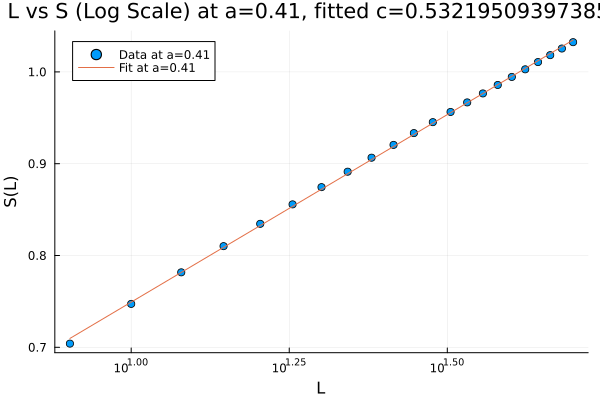

Calculating for a = 0.42, L = 8
Calculating for a = 0.42, L = 10
Calculating for a = 0.42, L = 12
Calculating for a = 0.42, L = 14
Calculating for a = 0.42, L = 16
Calculating for a = 0.42, L = 18
Calculating for a = 0.42, L = 20
Calculating for a = 0.42, L = 22
Calculating for a = 0.42, L = 24
Calculating for a = 0.42, L = 26
Calculating for a = 0.42, L = 28
Calculating for a = 0.42, L = 30
Calculating for a = 0.42, L = 32
Calculating for a = 0.42, L = 34
Calculating for a = 0.42, L = 36
Calculating for a = 0.42, L = 38
Calculating for a = 0.42, L = 40
Calculating for a = 0.42, L = 42
Calculating for a = 0.42, L = 44
Calculating for a = 0.42, L = 46
Calculating for a = 0.42, L = 48
Calculating for a = 0.42, L = 50


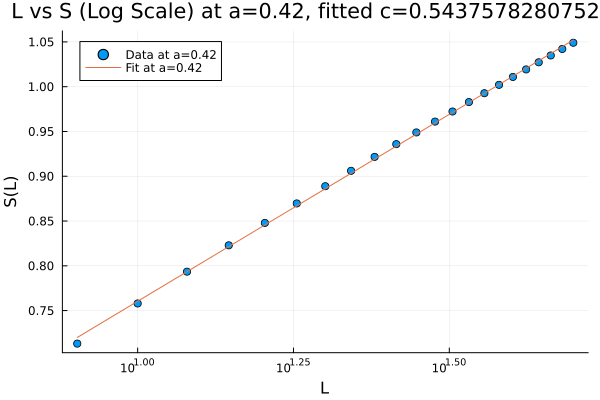

Calculating for a = 0.43, L = 8
Calculating for a = 0.43, L = 10
Calculating for a = 0.43, L = 12
Calculating for a = 0.43, L = 14
Calculating for a = 0.43, L = 16
Calculating for a = 0.43, L = 18
Calculating for a = 0.43, L = 20
Calculating for a = 0.43, L = 22
Calculating for a = 0.43, L = 24
Calculating for a = 0.43, L = 26
Calculating for a = 0.43, L = 28
Calculating for a = 0.43, L = 30
Calculating for a = 0.43, L = 32
Calculating for a = 0.43, L = 34
Calculating for a = 0.43, L = 36
Calculating for a = 0.43, L = 38
Calculating for a = 0.43, L = 40
Calculating for a = 0.43, L = 42
Calculating for a = 0.43, L = 44
Calculating for a = 0.43, L = 46
Calculating for a = 0.43, L = 48
Calculating for a = 0.43, L = 50


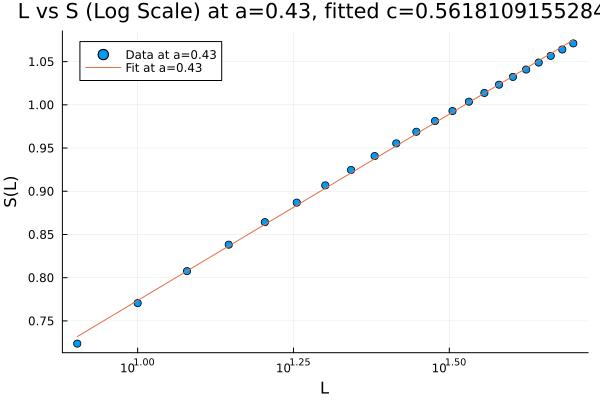

Calculating for a = 0.44, L = 8
Calculating for a = 0.44, L = 10
Calculating for a = 0.44, L = 12
Calculating for a = 0.44, L = 14
Calculating for a = 0.44, L = 16
Calculating for a = 0.44, L = 18
Calculating for a = 0.44, L = 20
Calculating for a = 0.44, L = 22
Calculating for a = 0.44, L = 24
Calculating for a = 0.44, L = 26
Calculating for a = 0.44, L = 28
Calculating for a = 0.44, L = 30
Calculating for a = 0.44, L = 32
Calculating for a = 0.44, L = 34
Calculating for a = 0.44, L = 36
Calculating for a = 0.44, L = 38
Calculating for a = 0.44, L = 40
Calculating for a = 0.44, L = 42
Calculating for a = 0.44, L = 44
Calculating for a = 0.44, L = 46
Calculating for a = 0.44, L = 48
Calculating for a = 0.44, L = 50


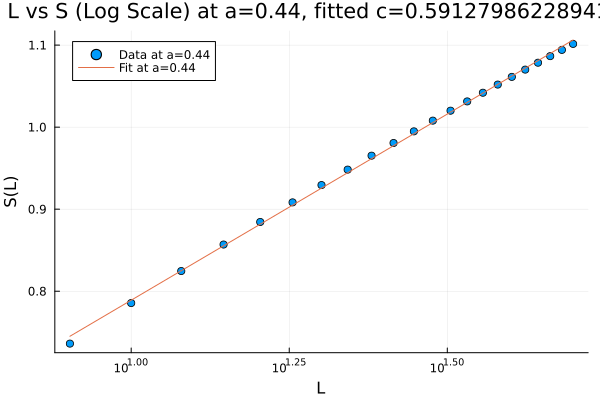

Calculating for a = 0.45, L = 8
Calculating for a = 0.45, L = 10
Calculating for a = 0.45, L = 12
Calculating for a = 0.45, L = 14
Calculating for a = 0.45, L = 16
Calculating for a = 0.45, L = 18
Calculating for a = 0.45, L = 20
Calculating for a = 0.45, L = 22
Calculating for a = 0.45, L = 24
Calculating for a = 0.45, L = 26
Calculating for a = 0.45, L = 28
Calculating for a = 0.45, L = 30
Calculating for a = 0.45, L = 32
Calculating for a = 0.45, L = 34
Calculating for a = 0.45, L = 36
Calculating for a = 0.45, L = 38
Calculating for a = 0.45, L = 40
Calculating for a = 0.45, L = 42
Calculating for a = 0.45, L = 44
Calculating for a = 0.45, L = 46
Calculating for a = 0.45, L = 48
Calculating for a = 0.45, L = 50


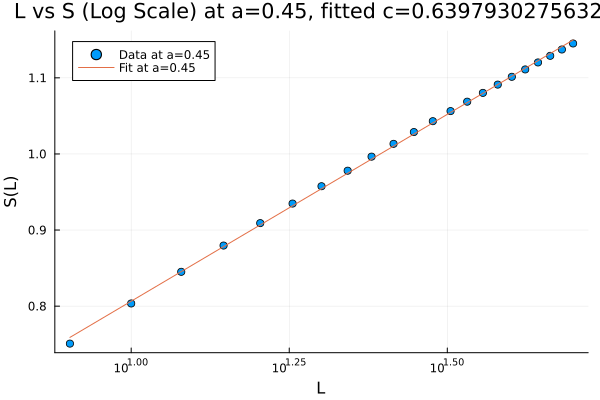

Calculating for a = 0.46, L = 8
Calculating for a = 0.46, L = 10
Calculating for a = 0.46, L = 12
Calculating for a = 0.46, L = 14
Calculating for a = 0.46, L = 16
Calculating for a = 0.46, L = 18
Calculating for a = 0.46, L = 20
Calculating for a = 0.46, L = 22
Calculating for a = 0.46, L = 24
Calculating for a = 0.46, L = 26
Calculating for a = 0.46, L = 28
Calculating for a = 0.46, L = 30
Calculating for a = 0.46, L = 32
Calculating for a = 0.46, L = 34
Calculating for a = 0.46, L = 36
Calculating for a = 0.46, L = 38
Calculating for a = 0.46, L = 40
Calculating for a = 0.46, L = 42
Calculating for a = 0.46, L = 44
Calculating for a = 0.46, L = 46
Calculating for a = 0.46, L = 48
Calculating for a = 0.46, L = 50


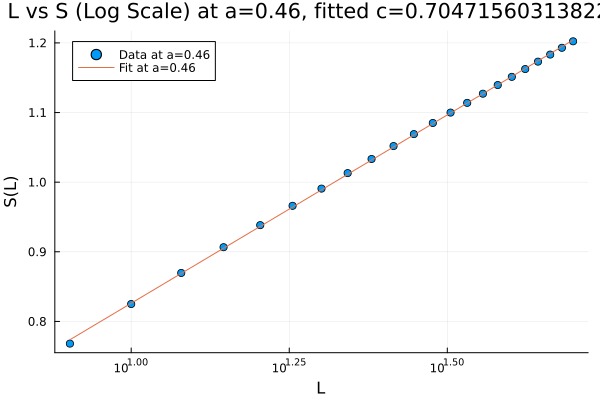

Calculating for a = 0.47, L = 8
Calculating for a = 0.47, L = 10
Calculating for a = 0.47, L = 12
Calculating for a = 0.47, L = 14
Calculating for a = 0.47, L = 16
Calculating for a = 0.47, L = 18
Calculating for a = 0.47, L = 20
Calculating for a = 0.47, L = 22
Calculating for a = 0.47, L = 24
Calculating for a = 0.47, L = 26
Calculating for a = 0.47, L = 28
Calculating for a = 0.47, L = 30
Calculating for a = 0.47, L = 32
Calculating for a = 0.47, L = 34
Calculating for a = 0.47, L = 36
Calculating for a = 0.47, L = 38
Calculating for a = 0.47, L = 40
Calculating for a = 0.47, L = 42
Calculating for a = 0.47, L = 44
Calculating for a = 0.47, L = 46
Calculating for a = 0.47, L = 48
Calculating for a = 0.47, L = 50


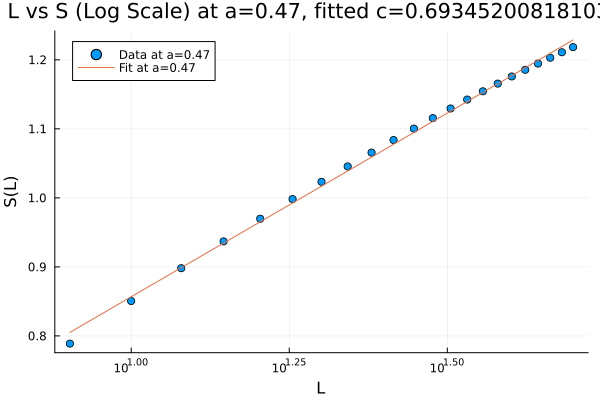

Calculating for a = 0.48, L = 8
Calculating for a = 0.48, L = 10
Calculating for a = 0.48, L = 12
Calculating for a = 0.48, L = 14
Calculating for a = 0.48, L = 16
Calculating for a = 0.48, L = 18
Calculating for a = 0.48, L = 20
Calculating for a = 0.48, L = 22
Calculating for a = 0.48, L = 24
Calculating for a = 0.48, L = 26
Calculating for a = 0.48, L = 28
Calculating for a = 0.48, L = 30
Calculating for a = 0.48, L = 32
Calculating for a = 0.48, L = 34
Calculating for a = 0.48, L = 36
Calculating for a = 0.48, L = 38
Calculating for a = 0.48, L = 40
Calculating for a = 0.48, L = 42
Calculating for a = 0.48, L = 44
Calculating for a = 0.48, L = 46
Calculating for a = 0.48, L = 48
Calculating for a = 0.48, L = 50


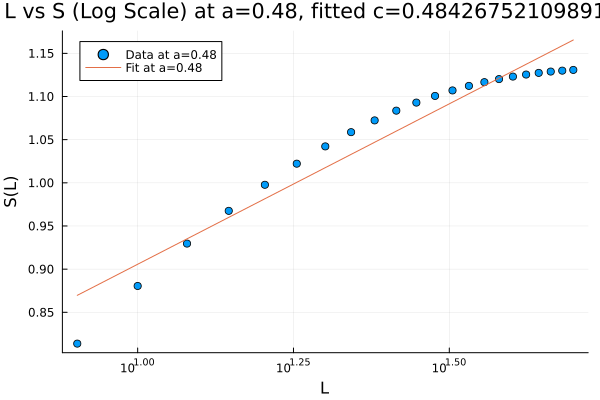

Calculating for a = 0.49, L = 8
Calculating for a = 0.49, L = 10
Calculating for a = 0.49, L = 12
Calculating for a = 0.49, L = 14
Calculating for a = 0.49, L = 16
Calculating for a = 0.49, L = 18
Calculating for a = 0.49, L = 20
Calculating for a = 0.49, L = 22
Calculating for a = 0.49, L = 24
Calculating for a = 0.49, L = 26
Calculating for a = 0.49, L = 28
Calculating for a = 0.49, L = 30
Calculating for a = 0.49, L = 32
Calculating for a = 0.49, L = 34
Calculating for a = 0.49, L = 36
Calculating for a = 0.49, L = 38
Calculating for a = 0.49, L = 40
Calculating for a = 0.49, L = 42
Calculating for a = 0.49, L = 44
Calculating for a = 0.49, L = 46
Calculating for a = 0.49, L = 48
Calculating for a = 0.49, L = 50


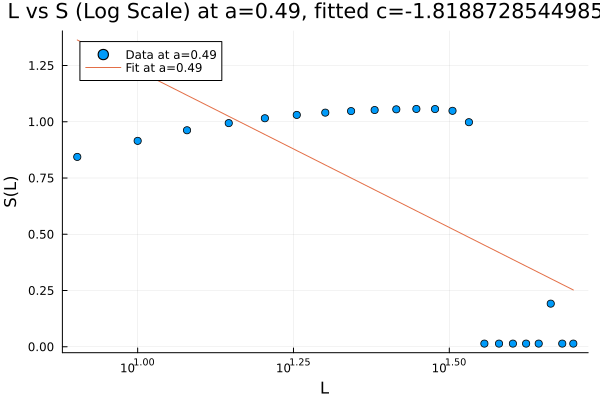

Calculating for a = 0.5, L = 8
Calculating for a = 0.5, L = 10
Calculating for a = 0.5, L = 12
Calculating for a = 0.5, L = 14
Calculating for a = 0.5, L = 16
Calculating for a = 0.5, L = 18
Calculating for a = 0.5, L = 20
Calculating for a = 0.5, L = 22
Calculating for a = 0.5, L = 24
Calculating for a = 0.5, L = 26
Calculating for a = 0.5, L = 28
Calculating for a = 0.5, L = 30
Calculating for a = 0.5, L = 32
Calculating for a = 0.5, L = 34
Calculating for a = 0.5, L = 36
Calculating for a = 0.5, L = 38
Calculating for a = 0.5, L = 40
Calculating for a = 0.5, L = 42
Calculating for a = 0.5, L = 44
Calculating for a = 0.5, L = 46
Calculating for a = 0.5, L = 48
Calculating for a = 0.5, L = 50


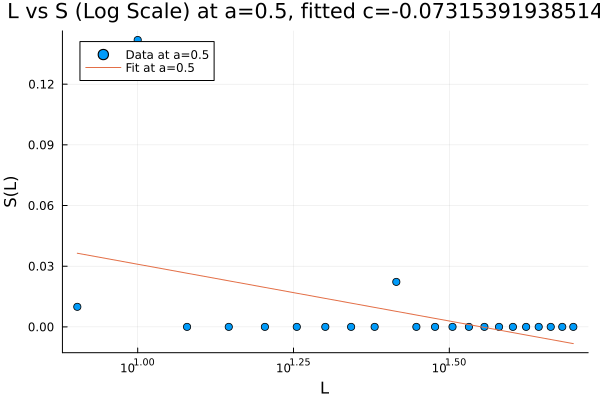

Calculating for a = 0.51, L = 8
Calculating for a = 0.51, L = 10
Calculating for a = 0.51, L = 12
Calculating for a = 0.51, L = 14
Calculating for a = 0.51, L = 16
Calculating for a = 0.51, L = 18
Calculating for a = 0.51, L = 20
Calculating for a = 0.51, L = 22
Calculating for a = 0.51, L = 24
Calculating for a = 0.51, L = 26
Calculating for a = 0.51, L = 28
Calculating for a = 0.51, L = 30
Calculating for a = 0.51, L = 32
Calculating for a = 0.51, L = 34
Calculating for a = 0.51, L = 36
Calculating for a = 0.51, L = 38
Calculating for a = 0.51, L = 40
Calculating for a = 0.51, L = 42
Calculating for a = 0.51, L = 44
Calculating for a = 0.51, L = 46
Calculating for a = 0.51, L = 48
Calculating for a = 0.51, L = 50


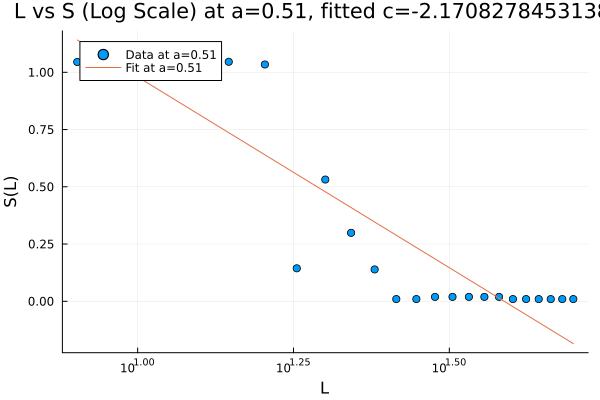

Calculating for a = 0.52, L = 8
Calculating for a = 0.52, L = 10
Calculating for a = 0.52, L = 12
Calculating for a = 0.52, L = 14
Calculating for a = 0.52, L = 16
Calculating for a = 0.52, L = 18
Calculating for a = 0.52, L = 20
Calculating for a = 0.52, L = 22
Calculating for a = 0.52, L = 24
Calculating for a = 0.52, L = 26
Calculating for a = 0.52, L = 28
Calculating for a = 0.52, L = 30
Calculating for a = 0.52, L = 32
Calculating for a = 0.52, L = 34
Calculating for a = 0.52, L = 36
Calculating for a = 0.52, L = 38
Calculating for a = 0.52, L = 40
Calculating for a = 0.52, L = 42
Calculating for a = 0.52, L = 44
Calculating for a = 0.52, L = 46
Calculating for a = 0.52, L = 48
Calculating for a = 0.52, L = 50


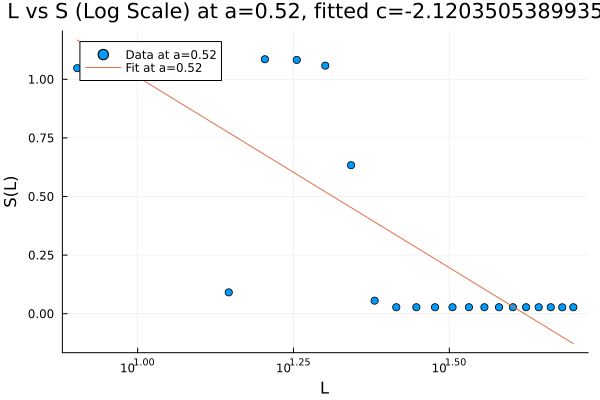

Calculating for a = 0.53, L = 8
Calculating for a = 0.53, L = 10
Calculating for a = 0.53, L = 12
Calculating for a = 0.53, L = 14
Calculating for a = 0.53, L = 16
Calculating for a = 0.53, L = 18
Calculating for a = 0.53, L = 20
Calculating for a = 0.53, L = 22
Calculating for a = 0.53, L = 24
Calculating for a = 0.53, L = 26
Calculating for a = 0.53, L = 28
Calculating for a = 0.53, L = 30
Calculating for a = 0.53, L = 32
Calculating for a = 0.53, L = 34
Calculating for a = 0.53, L = 36
Calculating for a = 0.53, L = 38
Calculating for a = 0.53, L = 40
Calculating for a = 0.53, L = 42
Calculating for a = 0.53, L = 44
Calculating for a = 0.53, L = 46
Calculating for a = 0.53, L = 48
Calculating for a = 0.53, L = 50


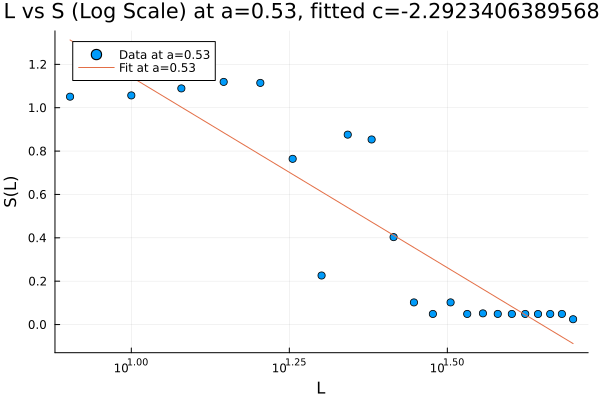

Calculating for a = 0.54, L = 8
Calculating for a = 0.54, L = 10
Calculating for a = 0.54, L = 12
Calculating for a = 0.54, L = 14
Calculating for a = 0.54, L = 16
Calculating for a = 0.54, L = 18
Calculating for a = 0.54, L = 20
Calculating for a = 0.54, L = 22
Calculating for a = 0.54, L = 24
Calculating for a = 0.54, L = 26
Calculating for a = 0.54, L = 28
Calculating for a = 0.54, L = 30
Calculating for a = 0.54, L = 32
Calculating for a = 0.54, L = 34
Calculating for a = 0.54, L = 36
Calculating for a = 0.54, L = 38
Calculating for a = 0.54, L = 40
Calculating for a = 0.54, L = 42
Calculating for a = 0.54, L = 44
Calculating for a = 0.54, L = 46
Calculating for a = 0.54, L = 48
Calculating for a = 0.54, L = 50


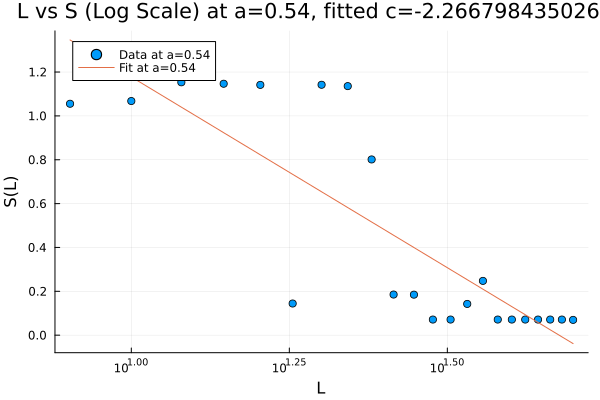

Calculating for a = 0.55, L = 8
Calculating for a = 0.55, L = 10
Calculating for a = 0.55, L = 12
Calculating for a = 0.55, L = 14
Calculating for a = 0.55, L = 16
Calculating for a = 0.55, L = 18
Calculating for a = 0.55, L = 20
Calculating for a = 0.55, L = 22
Calculating for a = 0.55, L = 24
Calculating for a = 0.55, L = 26
Calculating for a = 0.55, L = 28
Calculating for a = 0.55, L = 30
Calculating for a = 0.55, L = 32
Calculating for a = 0.55, L = 34
Calculating for a = 0.55, L = 36
Calculating for a = 0.55, L = 38
Calculating for a = 0.55, L = 40
Calculating for a = 0.55, L = 42
Calculating for a = 0.55, L = 44
Calculating for a = 0.55, L = 46
Calculating for a = 0.55, L = 48
Calculating for a = 0.55, L = 50


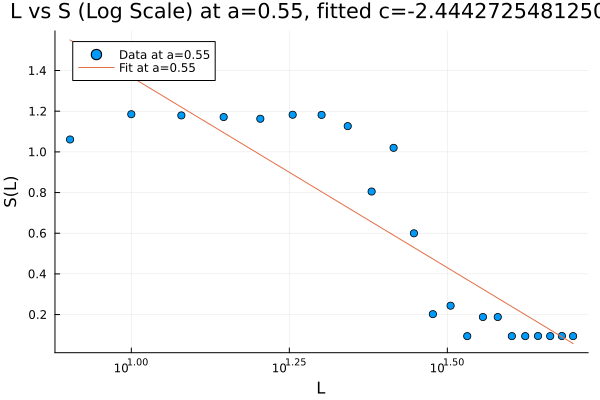

Calculating for a = 0.56, L = 8
Calculating for a = 0.56, L = 10
Calculating for a = 0.56, L = 12
Calculating for a = 0.56, L = 14
Calculating for a = 0.56, L = 16
Calculating for a = 0.56, L = 18
Calculating for a = 0.56, L = 20
Calculating for a = 0.56, L = 22
Calculating for a = 0.56, L = 24
Calculating for a = 0.56, L = 26
Calculating for a = 0.56, L = 28
Calculating for a = 0.56, L = 30
Calculating for a = 0.56, L = 32
Calculating for a = 0.56, L = 34
Calculating for a = 0.56, L = 36
Calculating for a = 0.56, L = 38
Calculating for a = 0.56, L = 40
Calculating for a = 0.56, L = 42
Calculating for a = 0.56, L = 44
Calculating for a = 0.56, L = 46
Calculating for a = 0.56, L = 48
Calculating for a = 0.56, L = 50


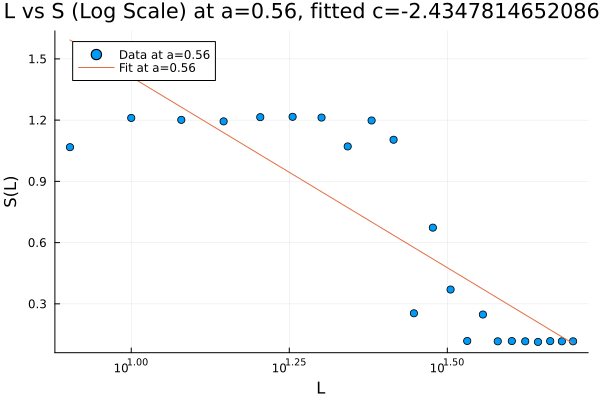

Calculating for a = 0.57, L = 8
Calculating for a = 0.57, L = 10
Calculating for a = 0.57, L = 12
Calculating for a = 0.57, L = 14
Calculating for a = 0.57, L = 16
Calculating for a = 0.57, L = 18
Calculating for a = 0.57, L = 20
Calculating for a = 0.57, L = 22
Calculating for a = 0.57, L = 24
Calculating for a = 0.57, L = 26
Calculating for a = 0.57, L = 28
Calculating for a = 0.57, L = 30
Calculating for a = 0.57, L = 32
Calculating for a = 0.57, L = 34
Calculating for a = 0.57, L = 36
Calculating for a = 0.57, L = 38
Calculating for a = 0.57, L = 40
Calculating for a = 0.57, L = 42
Calculating for a = 0.57, L = 44
Calculating for a = 0.57, L = 46
Calculating for a = 0.57, L = 48
Calculating for a = 0.57, L = 50


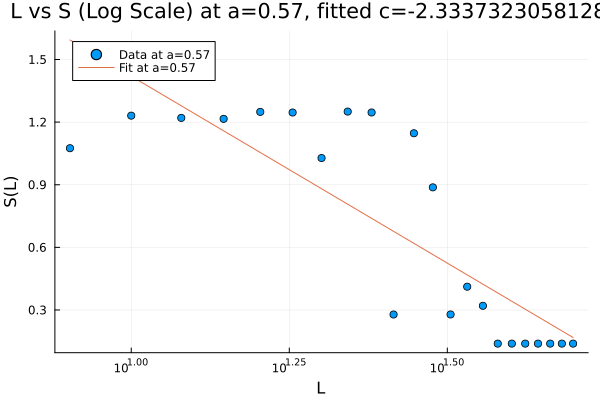

Calculating for a = 0.58, L = 8
Calculating for a = 0.58, L = 10
Calculating for a = 0.58, L = 12
Calculating for a = 0.58, L = 14
Calculating for a = 0.58, L = 16
Calculating for a = 0.58, L = 18
Calculating for a = 0.58, L = 20
Calculating for a = 0.58, L = 22
Calculating for a = 0.58, L = 24
Calculating for a = 0.58, L = 26
Calculating for a = 0.58, L = 28
Calculating for a = 0.58, L = 30
Calculating for a = 0.58, L = 32
Calculating for a = 0.58, L = 34
Calculating for a = 0.58, L = 36
Calculating for a = 0.58, L = 38
Calculating for a = 0.58, L = 40
Calculating for a = 0.58, L = 42
Calculating for a = 0.58, L = 44
Calculating for a = 0.58, L = 46
Calculating for a = 0.58, L = 48
Calculating for a = 0.58, L = 50


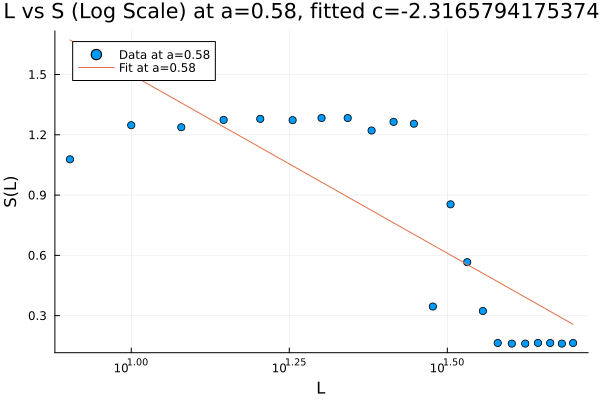

Calculating for a = 0.59, L = 8
Calculating for a = 0.59, L = 10
Calculating for a = 0.59, L = 12
Calculating for a = 0.59, L = 14
Calculating for a = 0.59, L = 16
Calculating for a = 0.59, L = 18
Calculating for a = 0.59, L = 20
Calculating for a = 0.59, L = 22
Calculating for a = 0.59, L = 24
Calculating for a = 0.59, L = 26
Calculating for a = 0.59, L = 28
Calculating for a = 0.59, L = 30
Calculating for a = 0.59, L = 32
Calculating for a = 0.59, L = 34
Calculating for a = 0.59, L = 36
Calculating for a = 0.59, L = 38
Calculating for a = 0.59, L = 40
Calculating for a = 0.59, L = 42
Calculating for a = 0.59, L = 44
Calculating for a = 0.59, L = 46
Calculating for a = 0.59, L = 48
Calculating for a = 0.59, L = 50


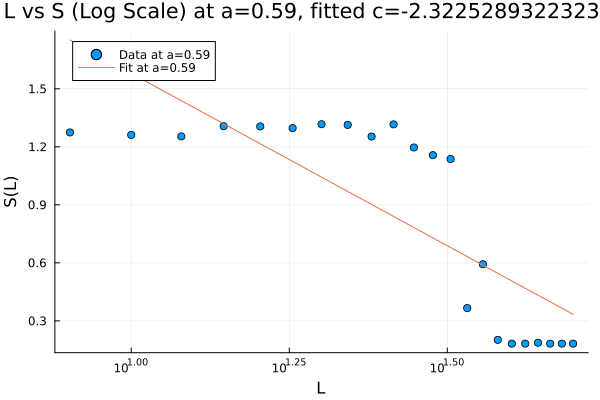

Calculating for a = 0.6, L = 8
Calculating for a = 0.6, L = 10
Calculating for a = 0.6, L = 12
Calculating for a = 0.6, L = 14
Calculating for a = 0.6, L = 16
Calculating for a = 0.6, L = 18
Calculating for a = 0.6, L = 20
Calculating for a = 0.6, L = 22
Calculating for a = 0.6, L = 24
Calculating for a = 0.6, L = 26
Calculating for a = 0.6, L = 28
Calculating for a = 0.6, L = 30
Calculating for a = 0.6, L = 32
Calculating for a = 0.6, L = 34
Calculating for a = 0.6, L = 36
Calculating for a = 0.6, L = 38
Calculating for a = 0.6, L = 40
Calculating for a = 0.6, L = 42
Calculating for a = 0.6, L = 44
Calculating for a = 0.6, L = 46
Calculating for a = 0.6, L = 48
Calculating for a = 0.6, L = 50


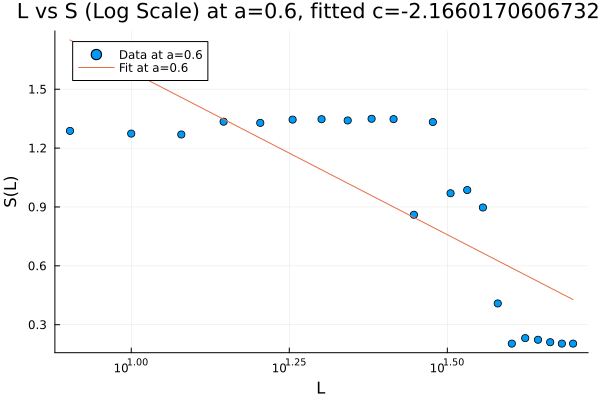

a: 0.01, fitted central charge c: 0.49909908097472094
a: 0.02, fitted central charge c: 0.4991028844585318
a: 0.03, fitted central charge c: 0.4991095263368338
a: 0.04, fitted central charge c: 0.4991191670946813
a: 0.05, fitted central charge c: 0.4991321071400262
a: 0.06, fitted central charge c: 0.4991486451935184
a: 0.07, fitted central charge c: 0.4991690903640533
a: 0.08, fitted central charge c: 0.49919394091498703
a: 0.09, fitted central charge c: 0.4992236270289404
a: 0.1, fitted central charge c: 0.49925866039877753
a: 0.11, fitted central charge c: 0.4992995911081183
a: 0.12, fitted central charge c: 0.4993470928678228
a: 0.13, fitted central charge c: 0.4994019206824295
a: 0.14, fitted central charge c: 0.4994649335242054
a: 0.15, fitted central charge c: 0.4995370903241871
a: 0.16, fitted central charge c: 0.49961949089372704
a: 0.17, fitted central charge c: 0.49971343679144625
a: 0.18, fitted central charge c: 0.49982039912073395
a: 0.19, fitted central charge c: 0.49994

In [11]:
L_list = [8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40,42,44,46,48,50] 
E_list = zeros(size(L_list))
S_list = zeros(size(L_list))

# aの値を0.46から0.475まで0.0005間隔で変化させる
a_values = 0.01:0.01:0.6
c_values = []

println("Starting loop")
for a in a_values
    entropy_values = []  # エントロピーの値を保存するためのリスト

    for i = 1:length(L_list)
        println("Calculating for a = $a, L = $(L_list[i])")
        E, S = dmrg_critical_TF(a, L_list[i])
        E_list[i] = E
        S_list[i] = S
        push!(entropy_values, (L_list[i], S))  # エントロピーの値を保存
    end

    # エントロピーの値をファイルに保存
    open("entropy_values_a_$a.txt", "w") do file
        for val in entropy_values
            println(file, val)
        end
    end

    log_L_list = log.(L_list)
    data = hcat(ones(length(log_L_list)), log_L_list)
    coeffs = data \ S_list
    c_fit = coeffs[2] * 3
    push!(c_values, (a, c_fit))

    plot_title = "L vs S (Log Scale) at a=$a, fitted c=$c_fit"
    plot_fig = Plots.plot(L_list, S_list, seriestype=:scatter, label="Data at a=$a", xscale=:log10, legend=:topleft)
    Plots.plot!(plot_fig, L_list, data * coeffs, label="Fit at a=$a")
    xlabel!(plot_fig, "L")
    ylabel!(plot_fig, "S(L)")
    title!(plot_fig, plot_title)
    display(plot_fig)

    # グラフをPDF形式で保存
    Plots.savefig(plot_fig, "plot_a_$a.pdf")
end

# a と c の値を出力
for pair in c_values
    println("a: $(pair[1]), fitted central charge c: $(pair[2])")
end

Starting loop
Calculating for a = 0.455, L = 8
Calculating for a = 0.455, L = 10
Calculating for a = 0.455, L = 12
Calculating for a = 0.455, L = 14
Calculating for a = 0.455, L = 16
Calculating for a = 0.455, L = 18
Calculating for a = 0.455, L = 20
Calculating for a = 0.455, L = 22
Calculating for a = 0.455, L = 24
Calculating for a = 0.455, L = 26
Calculating for a = 0.455, L = 28
Calculating for a = 0.455, L = 30
Calculating for a = 0.455, L = 32
Calculating for a = 0.455, L = 34
Calculating for a = 0.455, L = 36
Calculating for a = 0.455, L = 38
Calculating for a = 0.455, L = 40
Calculating for a = 0.455, L = 42
Calculating for a = 0.455, L = 44
Calculating for a = 0.455, L = 46
Calculating for a = 0.455, L = 48
Calculating for a = 0.455, L = 50


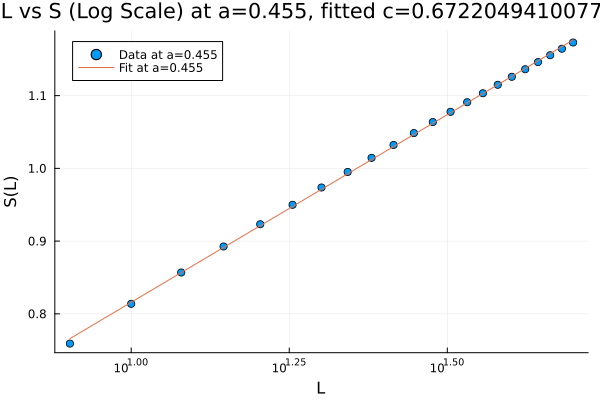

Calculating for a = 0.465, L = 8
Calculating for a = 0.465, L = 10
Calculating for a = 0.465, L = 12
Calculating for a = 0.465, L = 14
Calculating for a = 0.465, L = 16
Calculating for a = 0.465, L = 18
Calculating for a = 0.465, L = 20
Calculating for a = 0.465, L = 22
Calculating for a = 0.465, L = 24
Calculating for a = 0.465, L = 26
Calculating for a = 0.465, L = 28
Calculating for a = 0.465, L = 30
Calculating for a = 0.465, L = 32
Calculating for a = 0.465, L = 34
Calculating for a = 0.465, L = 36
Calculating for a = 0.465, L = 38
Calculating for a = 0.465, L = 40
Calculating for a = 0.465, L = 42
Calculating for a = 0.465, L = 44
Calculating for a = 0.465, L = 46
Calculating for a = 0.465, L = 48
Calculating for a = 0.465, L = 50


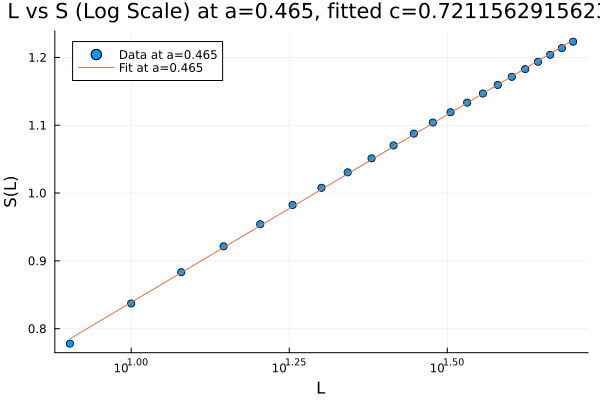

Calculating for a = 0.475, L = 8
Calculating for a = 0.475, L = 10
Calculating for a = 0.475, L = 12
Calculating for a = 0.475, L = 14
Calculating for a = 0.475, L = 16
Calculating for a = 0.475, L = 18
Calculating for a = 0.475, L = 20
Calculating for a = 0.475, L = 22
Calculating for a = 0.475, L = 24
Calculating for a = 0.475, L = 26
Calculating for a = 0.475, L = 28
Calculating for a = 0.475, L = 30
Calculating for a = 0.475, L = 32
Calculating for a = 0.475, L = 34
Calculating for a = 0.475, L = 36
Calculating for a = 0.475, L = 38
Calculating for a = 0.475, L = 40
Calculating for a = 0.475, L = 42
Calculating for a = 0.475, L = 44
Calculating for a = 0.475, L = 46
Calculating for a = 0.475, L = 48
Calculating for a = 0.475, L = 50


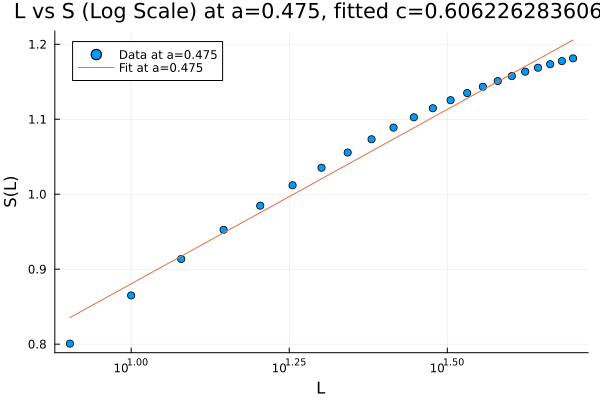

Calculating for a = 0.485, L = 8
Calculating for a = 0.485, L = 10
Calculating for a = 0.485, L = 12
Calculating for a = 0.485, L = 14
Calculating for a = 0.485, L = 16
Calculating for a = 0.485, L = 18
Calculating for a = 0.485, L = 20
Calculating for a = 0.485, L = 22
Calculating for a = 0.485, L = 24
Calculating for a = 0.485, L = 26
Calculating for a = 0.485, L = 28
Calculating for a = 0.485, L = 30
Calculating for a = 0.485, L = 32
Calculating for a = 0.485, L = 34
Calculating for a = 0.485, L = 36
Calculating for a = 0.485, L = 38
Calculating for a = 0.485, L = 40
Calculating for a = 0.485, L = 42
Calculating for a = 0.485, L = 44
Calculating for a = 0.485, L = 46
Calculating for a = 0.485, L = 48
Calculating for a = 0.485, L = 50


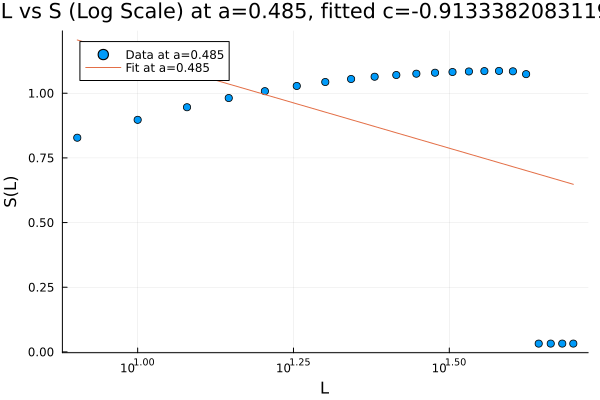

Calculating for a = 0.495, L = 8
Calculating for a = 0.495, L = 10
Calculating for a = 0.495, L = 12
Calculating for a = 0.495, L = 14
Calculating for a = 0.495, L = 16
Calculating for a = 0.495, L = 18
Calculating for a = 0.495, L = 20
Calculating for a = 0.495, L = 22
Calculating for a = 0.495, L = 24
Calculating for a = 0.495, L = 26
Calculating for a = 0.495, L = 28
Calculating for a = 0.495, L = 30
Calculating for a = 0.495, L = 32
Calculating for a = 0.495, L = 34
Calculating for a = 0.495, L = 36
Calculating for a = 0.495, L = 38
Calculating for a = 0.495, L = 40
Calculating for a = 0.495, L = 42
Calculating for a = 0.495, L = 44
Calculating for a = 0.495, L = 46
Calculating for a = 0.495, L = 48
Calculating for a = 0.495, L = 50


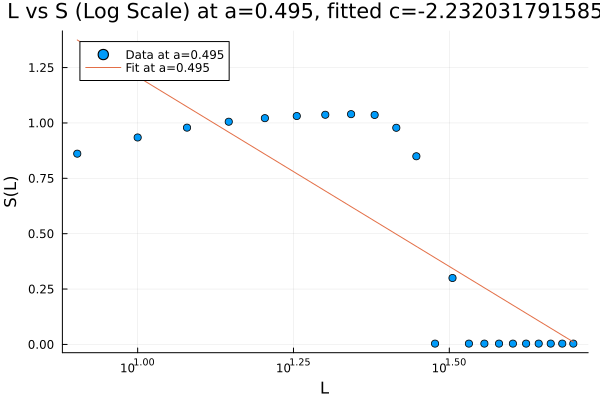

a: 0.455, fitted central charge c: 0.6722049410077605
a: 0.465, fitted central charge c: 0.721156291562311
a: 0.475, fitted central charge c: 0.60622628360637
a: 0.485, fitted central charge c: -0.9133382083119777
a: 0.495, fitted central charge c: -2.232031791585749


In [3]:
L_list = [8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40,42,44,46,48,50] 
E_list = zeros(size(L_list))
S_list = zeros(size(L_list))

# aの値を0.46から0.475まで0.0005間隔で変化させる
a_values = 0.455:0.01:0.495
c_values = []

println("Starting loop")
for a in a_values
    entropy_values = []  # エントロピーの値を保存するためのリスト

    for i = 1:length(L_list)
        println("Calculating for a = $a, L = $(L_list[i])")
        E, S = dmrg_critical_TF(a, L_list[i])
        E_list[i] = E
        S_list[i] = S
        push!(entropy_values, (L_list[i], S))  # エントロピーの値を保存
    end

    # エントロピーの値をファイルに保存
    open("entropy_values_a_$a.txt", "w") do file
        for val in entropy_values
            println(file, val)
        end
    end

    log_L_list = log.(L_list)
    data = hcat(ones(length(log_L_list)), log_L_list)
    coeffs = data \ S_list
    c_fit = coeffs[2] * 3
    push!(c_values, (a, c_fit))

    plot_title = "L vs S (Log Scale) at a=$a, fitted c=$c_fit"
    plot_fig = Plots.plot(L_list, S_list, seriestype=:scatter, label="Data at a=$a", xscale=:log10, legend=:topleft)
    Plots.plot!(plot_fig, L_list, data * coeffs, label="Fit at a=$a")
    xlabel!(plot_fig, "L")
    ylabel!(plot_fig, "S(L)")
    title!(plot_fig, plot_title)
    display(plot_fig)

    # グラフをPDF形式で保存
    Plots.savefig(plot_fig, "plot_a_$a.pdf")
end

# a と c の値を出力
for pair in c_values
    println("a: $(pair[1]), fitted central charge c: $(pair[2])")
end

In [8]:
function dmrg_APBC_gap(a, L)
    sites = siteinds("Fermion", L; conserve_qns=false)

    os = OpSum()
    
    # H_CTI
    for j=1:L-1
        jp1 = j % L + 1  # j+1 with periodic boundary

        coef =a*(1-a)  # 係数の計算
        os += coef, "C", jp1, "C", j
        os += -coef, "Cdag", jp1, "Cdag", j
        os += coef, "Cdag", jp1, "C", j
        os += -coef, "C", jp1, "Cdag", j
        os += -2*coef, "N", j
    end
    
    coef =a*(1-a)  # 係数の計算
    os += -coef, "C", 1, "C", L
    os += coef, "Cdag", 1, "Cdag", L
    os += -coef, "Cdag", 1, "C", L
    os += coef, "C", 1, "Cdag", L
    os += 2*coef, "N", L
    
   # H_int
   for j=1:L-1
        jp1 = j % L + 1  # j+1 with periodic boundary
        jm1 = j == 1 ? L : j - 1  # j-1 with periodic boundary

        coef = a^2  # 係数の計算
        os += coef, "C", jp1, "C", j
        os += -coef, "Cdag", jp1, "Cdag", j
        os += coef, "Cdag", jp1, "C", j
        os += -coef, "C", jp1, "Cdag", j
        os += -2*coef, "N", jm1,"C", jp1, "C", j
        os += 2*coef, "N", jm1, "Cdag", jp1, "Cdag", j
        os += -2*coef, "N", jm1, "Cdag", jp1, "C", j
        os += 2*coef, "N", jm1, "C", jp1, "Cdag", j
    end
    
        coef = a^2  # 係数の計算
        os += -coef, "C", 1, "C", L
        os += coef, "Cdag", 1, "Cdag", L
        os += -coef, "Cdag", 1, "C", L
        os += coef, "C", 1, "Cdag", L
        os += 2*coef, "N", L-1,"C", 1, "C", L
        os += -2*coef, "N", L-1, "Cdag", 1, "Cdag", L
        os += 2*coef, "N", L-1, "Cdag", 1, "C", L
        os += -2*coef, "N", L-1, "C", 1, "Cdag", L

    H = MPO(os, sites)
    psi0 = randomMPS(sites)

    # Numerical accuracy parameters
    nsweeps = 100
    maxdim = [10, 20, 100, 100, 200, 300]
    cutoff = 1E-10

    # Find the ground state
    energy_gs, psi_gs = dmrg(H, psi0; nsweeps, maxdim, cutoff,outputlevel=0)

    # Find the first excited state in the orthogonal complement of the ground state
    energy_es1, psi_es1 = dmrg(H,[psi_gs],psi0; nsweeps, maxdim, cutoff,outputlevel=0)
    
    gap=energy_es1 - energy_gs

    return gap
end

dmrg_APBC_gap (generic function with 1 method)

In [ ]:
gr(size=(1000, 300))

function calculate_and_plot_gaps(a_values)
    gap_pairs = Dict()
    for a in a_values
        gap = dmrg_APBC_gap(a, 50)
        push!(gap_pairs, a => [(50, gap)])

        ptintln("a=$a,AGap=$gap")
        plot_gaps(a, gap)
    end
    return gap_pairs
end

function save_gap_pairs_to_file(gap_pairs, filename)
    open(filename, "w") do file
        for (a, pairs) in gap_pairs
            write(file, "a=$a: (50, $(pairs[1][2])), \n")
        end
    end
end

# Calculate and plot for all a values
all_a_values = collect(0.05:0.05:0.45)
append!(all_a_values, 0.455:0.005:0.5)
gap_pairs = calculate_and_plot_gaps(all_a_values)

# Save to file
save_gap_pairs_to_file(gap_pairs, "Agap_pairs_all.txt")